# DM-34710: ApPipeWithFakes on DECam HiTS, July 2022

New baseline run, still using "old diffim" (before the big refactor). As a first step, I rebuilt all the calibs and set them as the new default in `DECam/calib` which is chained along by both input "defaults" collections.

* Uses new `decam_rings_v1` skymap
* Templates from HiTS 2014 are in `u/mrawls/DM-34710/templates`
* Final processing of HiTS 2015 is in `u/mrawls/DM-34710/hits2015-fakes`
* Postgres schema is `mrawls_DM34710_take2`
* Working directory on NCSA with bps logs, pipelines, etc. is `/project/mrawls/repo-main-logs/DM-34710`

For ApTemplate.yaml:
```
inCollection: DECam/defaults/hits2014,u/mrawls/DM-34710-hits-crosstalk-sources
dataQuery: "instrument='DECam' AND skymap='decam_rings_v1' AND detector NOT IN (2, 61) AND exposure<300000"
```
For ApPipeWithFakes.yaml:
```
inCollection: DECam/defaults/hits2015,u/mrawls/DM-34710-hits-crosstalk-sources,u/mrawls/DM-34710/templates
dataQuery: "instrument='DECam' AND skymap='decam_rings_v1' AND detector NOT IN (2, 61) AND exposure>400000"
```

The exposure cuts are necessary to force each pipeline to use only the 2014 images (numbered in the 200000s) for template building, and to use only the 2015 images (numbered in the 400000s) as science images. I called this run "take2" in a few places, because in "take1", I ran the processing without any constraints on exposure (visit) number, yet an intention to use only 2014 images for templates and only 2015 images for science. That doesn't work well with the good seeing selector, since it chose *nothing* for the entire solo field!

In addition, "take1" included notoriously bad visit number 289777 from 2014, which has a garbage WCS, but apparently great seeing, so there was a mysterious set of totally wrong DIA Sources showing up in at a Dec of -2 where there is no date. It has now been excised from `DECam/raw/all` and will never bother us again.

After all that, we have a pretty solid baseline run of `ApPipeWithFakes` on HiTS. It was a journey, as always, especially as the NCSA filesystem was having a Bad Day as it gets ever closer to sunsetting.

## Table of Contents

1. Loading DiaObjects and DiaSources
2. Typical "quick look analysis" plots
3. Separating the fake sources from the real sources
4. Fakes completeness analysis
5. SNR distributions
6. Troubleshooting appendix

In [1]:
%matplotlib notebook

import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as plticker
import importlib
import pandas as pd

from astropy.coordinates import SkyCoord
import astropy.units as u

import lsst.geom
import lsst.daf.butler as dafButler
from lsst.ap.association import UnpackApdbFlags, TransformDiaSourceCatalogConfig

sys.path.append('/project/mrawls/ap_pipe-notebooks/')
import diaObjectAnalysis as doa
import apdbPlots as pla
import plotLightcurve as plc
import coaddAnalysis as coa

Overriding default configuration file with /opt/lsst/software/stack/stack/miniconda3-py38_4.9.2-4.1.0/Linux64/dustmaps_cachedata/g41a3ec361e+ac198e9f13/config/.dustmapsrc


In [18]:
# Only if you change anything in the code imported above
importlib.reload(doa)
importlib.reload(pla)
importlib.reload(plc)
importlib.reload(coa)

<module 'coaddAnalysis' from '/project/mrawls/ap_pipe-notebooks/coaddAnalysis.py'>

## 1. Loading DiaObjects and DiaSources

In [2]:
repo = '/repo/main'
butler = dafButler.Butler(repo)
collections = 'u/mrawls/DM-34710/hits2015-fakes'
instrument = 'DECam'
skymap = 'decam_rings_v1'
schema = 'mrawls_DM34710_take2'

In [3]:
# Load a previous reprocessing from December 2021
collections_old = 'u/mrawls/DM-32245-DECam-fakes-all'
schema_old = 'mrawls_DM32245'

In [3]:
badFlagList = ['base_PixelFlags_flag_bad',
               'base_PixelFlags_flag_suspect',
               'base_PixelFlags_flag_saturatedCenter',
               'base_PixelFlags_flag_interpolated',
               'base_PixelFlags_flag_interpolatedCenter',
               'base_PixelFlags_flag_edge',
              ]

In [19]:
objTable, srcTable, goodObj, goodSrc = pla.loadTables(repo,
                                                      dbType='postgres',
                                                      dbName='lsstdevapdb1',
                                                      schema=schema,
                                                      gen='gen3',
                                                      instrument=instrument,
                                                      badFlagList=badFlagList)

/opt/lsst/software/stack/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-4.1.0/lib/python3.10/site-packages/pandas/io/sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
/opt/lsst/software/stack/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-4.1.0/lib/python3.10/site-packages/pandas/io/sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


In [20]:
srcTable = pla.addVisitCcdToSrcTable(srcTable, instrument=instrument, gen='gen3', butler=butler)
flagTable, srcTableFlags, flagFilter, goodSrc, goodObj = pla.makeSrcTableFlags(srcTable, objTable,
                                                                               badFlagList=badFlagList,
                                                                               gen='gen3',
                                                                               instrument=instrument,
                                                                               repo=repo)

In [7]:
objTable_old, srcTable_old, goodObj_old, goodSrc_old = pla.loadTables(repo,
                                                      dbType='postgres',
                                                      dbName='lsstdevapdb1',
                                                      schema=schema_old,
                                                      gen='gen3',
                                                      instrument=instrument,
                                                      badFlagList=badFlagList)

/opt/lsst/software/stack/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-4.1.0/lib/python3.10/site-packages/pandas/io/sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
/opt/lsst/software/stack/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-4.1.0/lib/python3.10/site-packages/pandas/io/sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


In [8]:
srcTable_old = pla.addVisitCcdToSrcTable(srcTable_old, instrument=instrument, gen='gen3', butler=butler)
flagTable_old, srcTableFlags_old, flagFilter_old, goodSrc_old, goodObj_old = pla.makeSrcTableFlags(srcTable_old,
                                                                               objTable_old,
                                                                               badFlagList=badFlagList,
                                                                               gen='gen3',
                                                                               instrument=instrument,
                                                                               repo=repo)

## 2. Typical "quick look analysis" plots

Including a visual comparison of an older Dec 2021 processing run

<IPython.core.display.Javascript object>


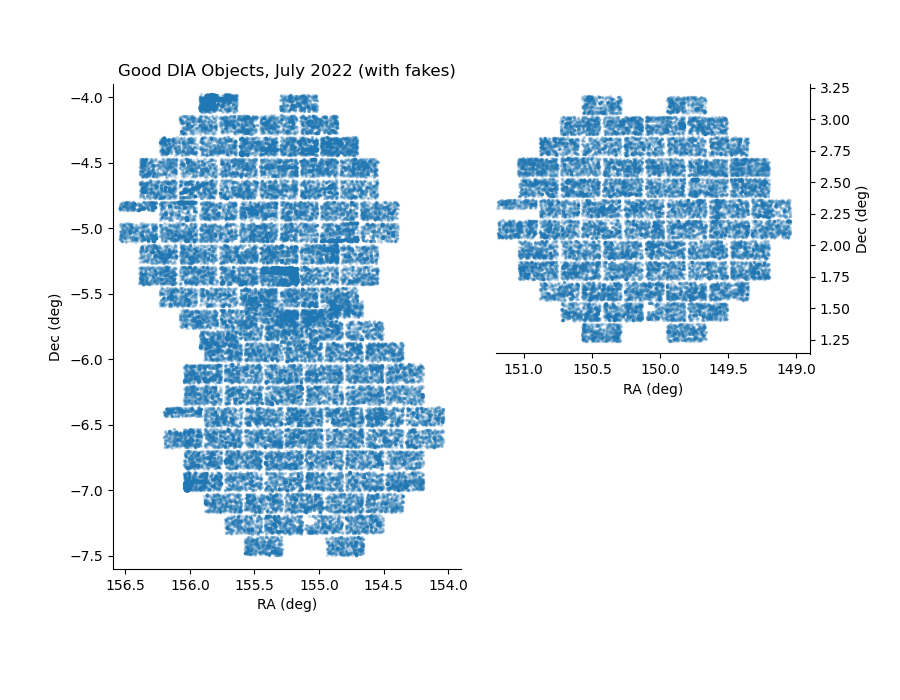

In [9]:
hitsPlot = pla.plotHitsSourcesOnSky(goodObj, title='Good DIA Objects, July 2022 (with fakes)')

<IPython.core.display.Javascript object>


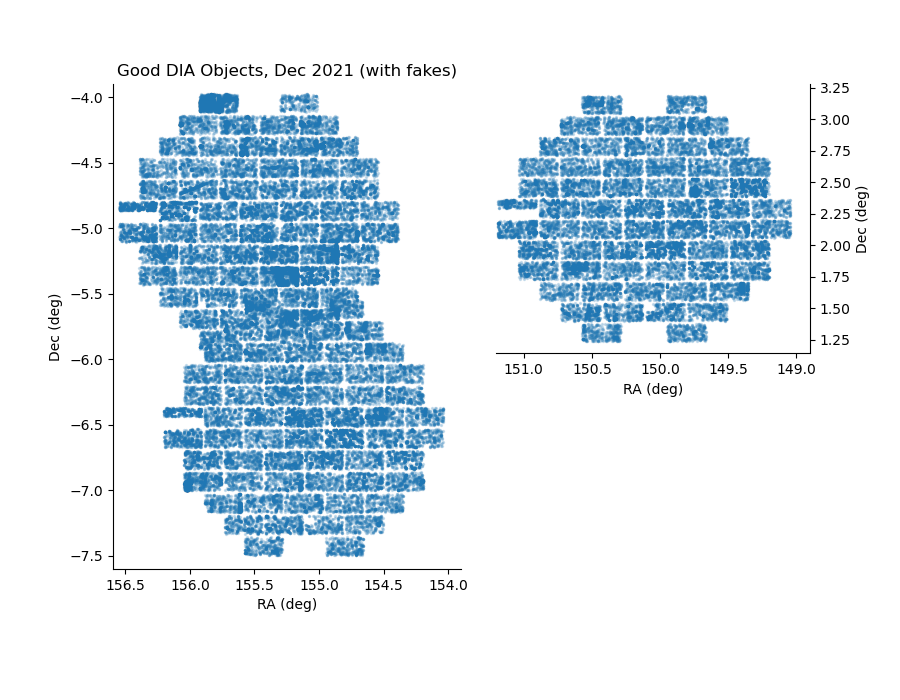

In [10]:
hitsPlot_old = pla.plotHitsSourcesOnSky(goodObj_old, title='Good DIA Objects, Dec 2021 (with fakes)')

<IPython.core.display.Javascript object>


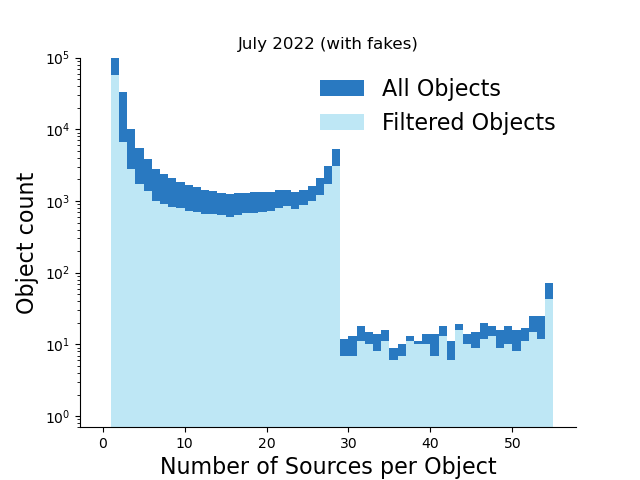

In [11]:
hist = doa.plotDiaObjectHistogram(objTable, goodObj, title='July 2022 (with fakes)')

<IPython.core.display.Javascript object>


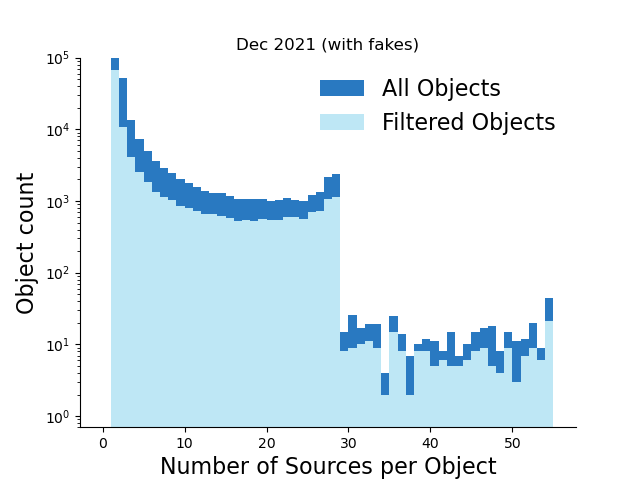

In [12]:
hist_old = doa.plotDiaObjectHistogram(objTable_old, goodObj_old, title='Dec 2021 (with fakes)')

<IPython.core.display.Javascript object>


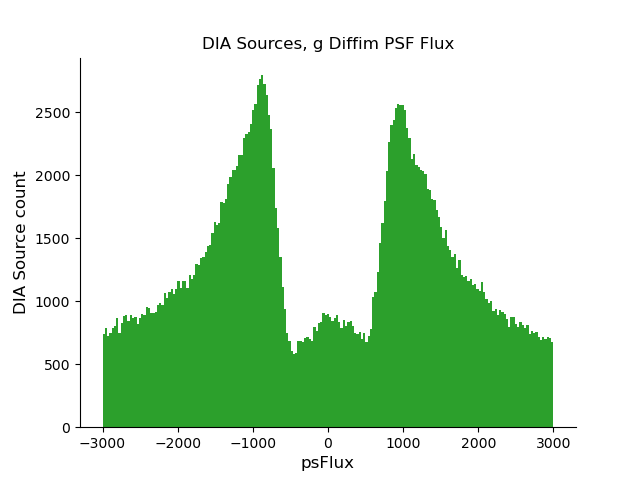

<IPython.core.display.Javascript object>


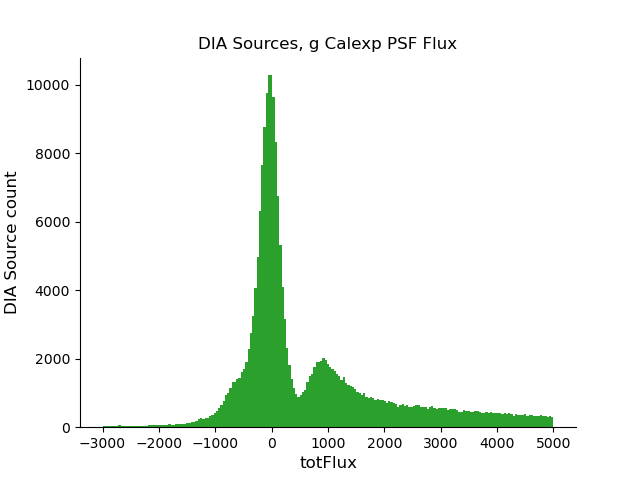

<IPython.core.display.Javascript object>


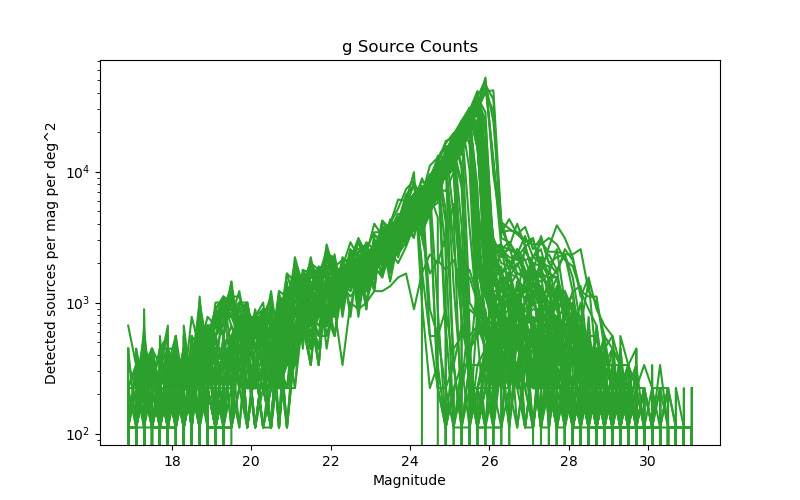

In [64]:
bandList = ['g']
colorList = ['C2']
collection = collections

for band, color in zip(bandList, colorList):
    pla.plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == band], fluxType='psFlux',
                        title=f'DIA Sources, {band} Diffim PSF Flux', color1=color, binmin=-3e3, binmax=3e3)
    pla.plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == band], fluxType='totFlux',
                        title=f'DIA Sources, {band} Calexp PSF Flux', color1=color, binmin=-3e3, binmax=5e3)
    pla.source_magnitude_histogram(repo, goodSrc, band, 'DECam', collection)

In [13]:
def spatial_flag_plot(df, flagName1, flagName2=None, operator=None, plotFlagged=True, plotUnFlagged=True, title=''):
    if flagName2 and operator:
        if operator == 'or':
            flagFilter = ((df[flagName1]) | (df[flagName2]))
            labelTrue = flagName1 + ' \nor ' + flagName2
            labelFalse = 'Neither ' + flagName1 + ' \nnor ' + flagName2
        elif operator == 'and':
            flagFilter = ((df[flagName1]) & (df[flagName2]))
            labelTrue = 'Both ' + flagName1 + ' \nand ' + flagName2
            labelFalse = 'Not ' + flagName1 + ' \nand ' + flagName2
        else:
            raise ValueError('Operator must be \'and\' or \n \'or\'')
    elif flagName2 and not operator:
        raise ValueError('Operator must be set if a second flag is given')
    else:  # just considering one flag
        flagFilter = (df[flagName1])
        labelTrue = flagName1
        labelFalse = 'No ' + flagName1
    flagFilterInverse = ~flagFilter
    
    fig, ax = plt.subplots(figsize=(9,6))
    if plotFlagged:
        scatterFlagged = ax.scatter(df.loc[flagFilter, 'ra'], df.loc[flagFilter, 'decl'], 
                    color='C3', s=5, alpha=0.2, label=labelTrue)
    if plotUnFlagged:
        scatterUnflagged = ax.scatter(df.loc[flagFilterInverse, 'ra'], df.loc[flagFilterInverse, 'decl'], 
                    color='C0', s=5, alpha=0.2, label=labelFalse)
    print('Flagged sources: {0}'.format(len(df.loc[flagFilter, 'ra'])))
    print('Unflagged sources: {0}'.format(len(df.loc[flagFilterInverse, 'ra'])))
    ax.set_xlabel('RA (deg)')
    ax.set_ylabel('Dec (deg)')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    xlim = (150.8, 149.8)
    ylim = (2.4, 3.1)
    plt.setp(ax, xlim=xlim, ylim=ylim)
    
    plt.title(title)

<IPython.core.display.Javascript object>


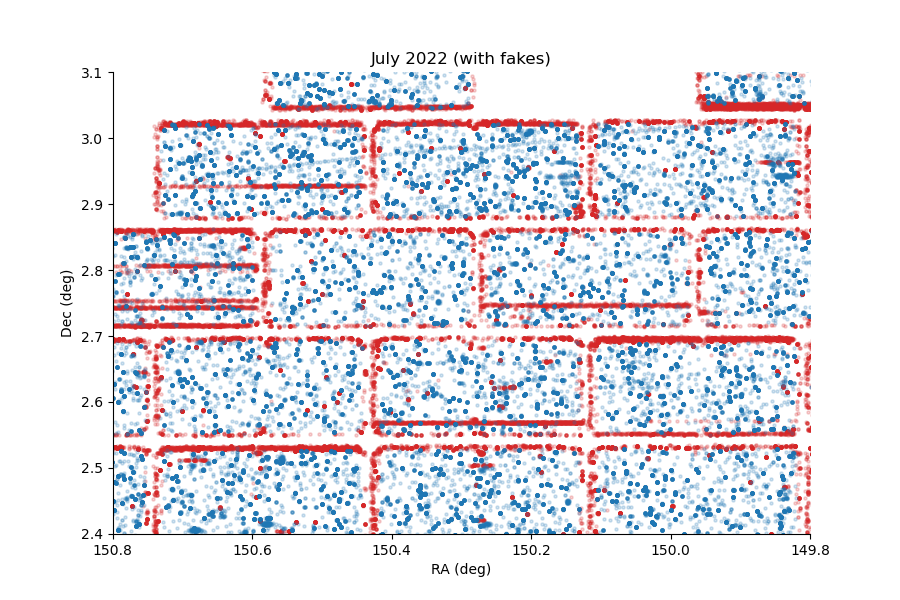

Flagged sources: 567294
Unflagged sources: 615864


In [14]:
spatial_flag_plot(srcTableFlags, 'base_PixelFlags_flag_edge', 'base_PixelFlags_flag_suspect', operator='or',
                  title='July 2022 (with fakes)')

<IPython.core.display.Javascript object>


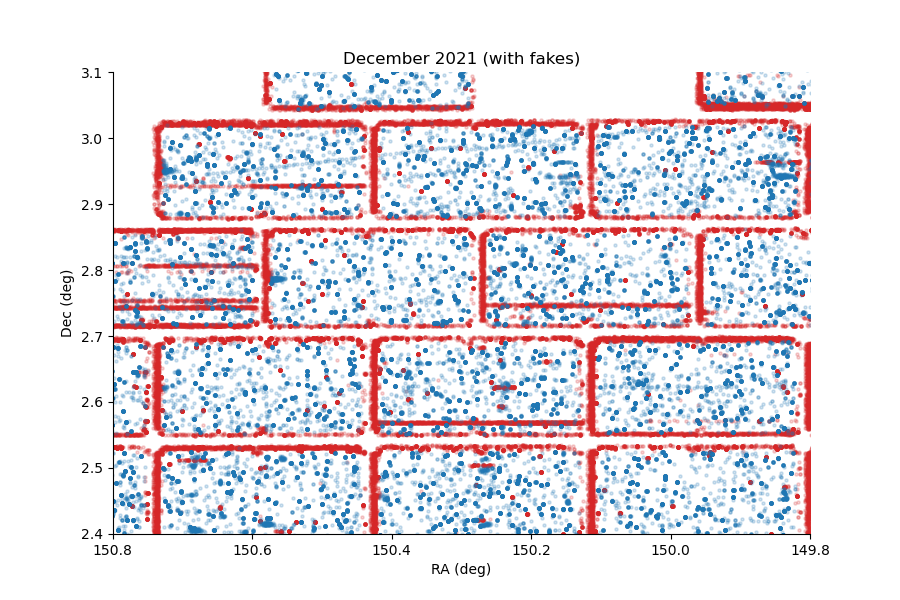

Flagged sources: 697719
Unflagged sources: 532901


In [15]:
spatial_flag_plot(srcTableFlags_old, 'base_PixelFlags_flag_edge', 'base_PixelFlags_flag_suspect', operator='or',
                  title='December 2021 (with fakes)')

<IPython.core.display.Javascript object>


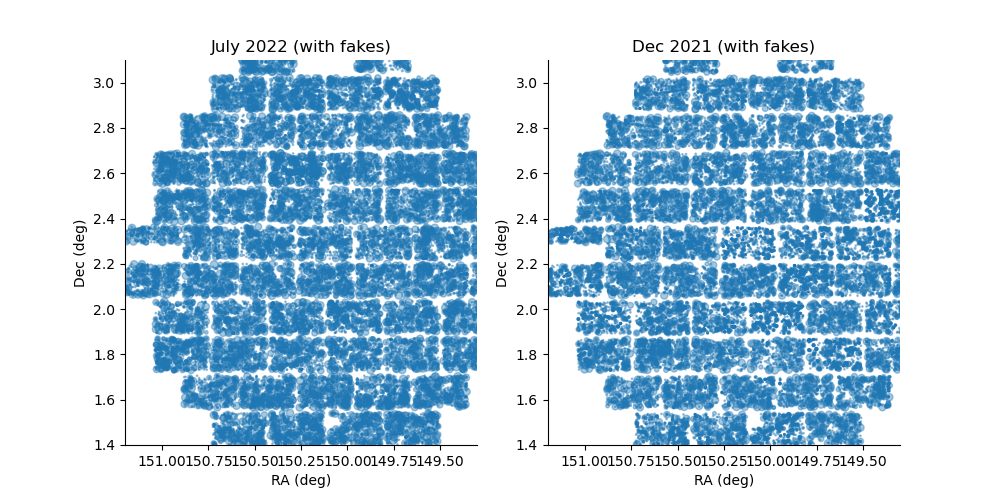

Text(0.5, 1.0, 'Dec 2021 (with fakes)')

In [16]:
fig = plt.figure(figsize=(10,5))

xlim = (151.2, 149.3)
ylim = (1.4, 3.1)

ax = fig.add_subplot(121)
plt.setp(ax, xlim=xlim, ylim=ylim)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.scatter(goodObj['ra'], goodObj['decl'], c='C0', s=goodObj['nDiaSources'], marker='o', alpha=0.4)
ax.set_xlabel('RA (deg)')
ax.set_ylabel('Dec (deg)')
ax.set_title('July 2022 (with fakes)')

ax2 = fig.add_subplot(122)
plt.setp(ax2, xlim=xlim, ylim=ylim)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.scatter(goodObj_old['ra'], goodObj_old['decl'], c='C0', s=goodObj_old['nDiaSources'], marker='o', alpha=0.4)
ax2.set_xlabel('RA (deg)')
ax2.set_ylabel('Dec (deg)')
ax2.set_title('Dec 2021 (with fakes)')

<IPython.core.display.Javascript object>


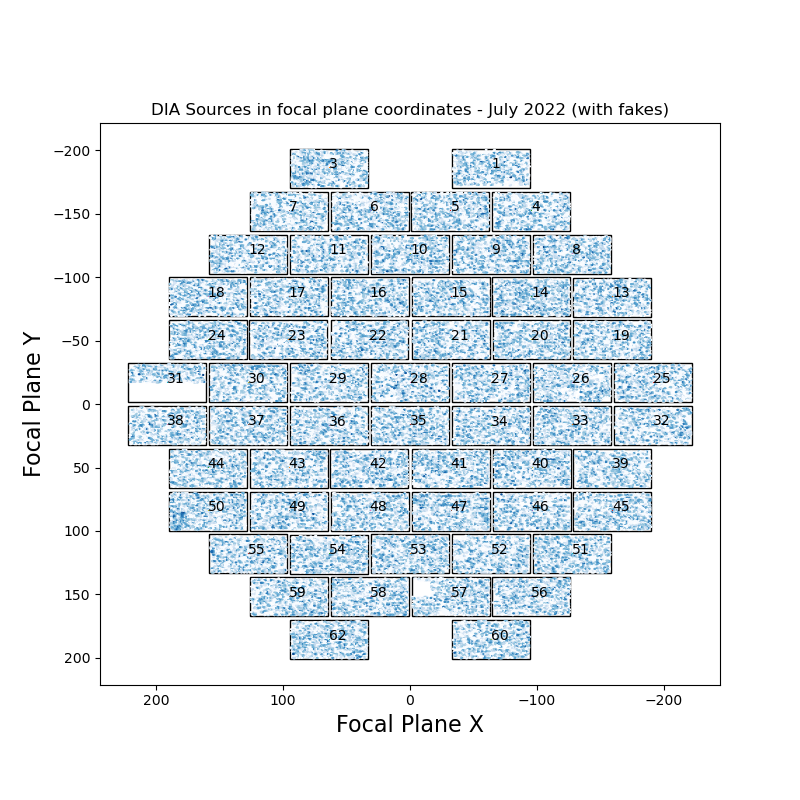

In [17]:
pla.plotDiaSourcesInFocalPlane(repo, goodSrc, title='- July 2022 (with fakes)', gen='gen3', instrument='DECam',
                               collections=collections)

<IPython.core.display.Javascript object>


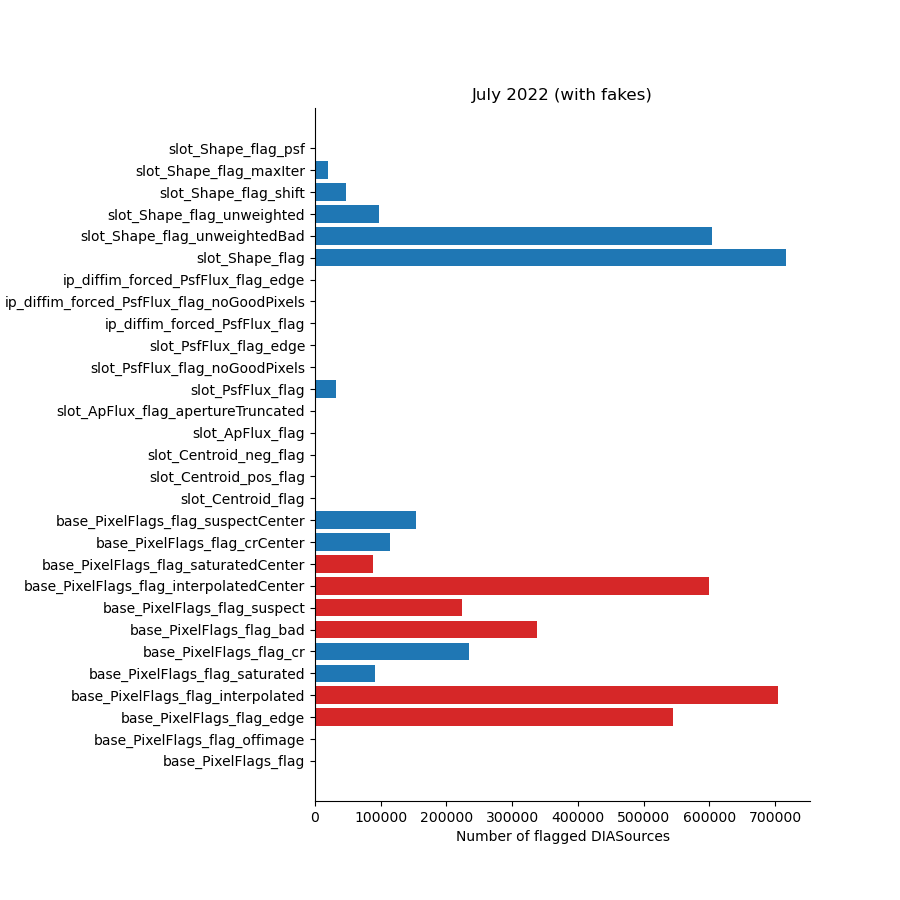

In [18]:
pla.plotFlagHist(srcTable, badFlagList=badFlagList, title='July 2022 (with fakes)')

<IPython.core.display.Javascript object>


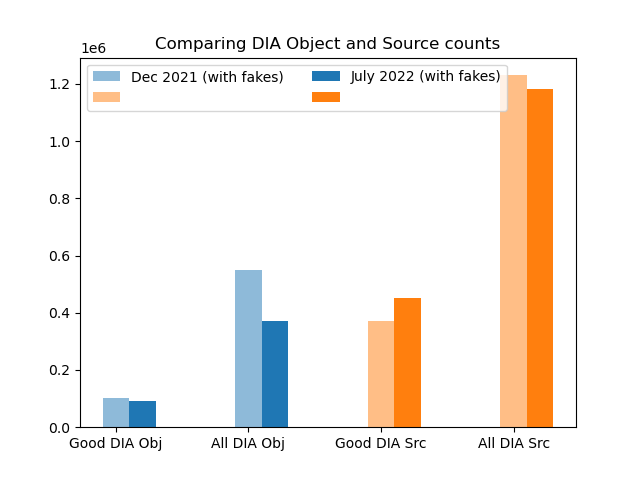

Text(0.5, 1.0, 'Comparing DIA Object and Source counts')

In [19]:
srcTable1 = srcTable_old
goodSrc1 = goodSrc_old
objTable1 = objTable_old
goodObj1 = goodObj_old
label1 = "Dec 2021 (with fakes)"

srcTable2 = srcTable
goodSrc2 = goodSrc
objTable2 = objTable
goodObj2 = goodObj
label2 = "July 2022 (with fakes)"

fig, ax = plt.subplots()
barLabels = ['Good DIA Obj', 'All DIA Obj', 'Good DIA Src', 'All DIA Src']
xbar = np.array([0, 1])
width = 0.2

# Dec 2021
ax.bar(xbar, [len(goodObj1), len(objTable1)], 
       width, label=label1, color='C0', alpha=0.5)
ax.bar(xbar + 2, [len(goodSrc1), len(srcTable1)],
       width, label=' ', color='C1', alpha=0.5)

# July 2022
ax.bar(xbar + width, [len(goodObj2), len(objTable2)], 
       width, label=label2, color='C0')
ax.bar(xbar + 2 + width, [len(goodSrc2), len(srcTable2)],
       width, label=' ', color='C1')

plt.legend(ncol=2)
ax.set_xticks([0, 1, 2, 3])
labels = ax.set_xticklabels(barLabels)
plt.title('Comparing DIA Object and Source counts')

## 3. Separating the fake sources from the real sources

In [6]:
tractList = [10054, 10055, 10056, 8122, 8123, 8362, 8363, 8364, 8604, 8605,
             8846, 8847, 9570, 9571, 9812, 9813, 9814]

In [7]:
dfs = [butler.get('fakes_fakeSourceCat', collections=collections,
                 instrument=instrument, skymap=skymap, tract=tract) for tract in tractList]
allInjectedFakes = pd.concat(dfs, ignore_index=True)

In [8]:
allInjectedFakes

,fakeId,dec,ra,isVisitSource,isTemplateSource,u_mag,g_mag,r_mag,i_mag,z_mag,y_mag,disk_semimajor,bulge_semimajor,disk_n,bulge_n,disk_axis_ratio,bulge_axis_ratio,disk_pa,bulge_pa,sourceType
0,11926566196082082415,0.055121,2.603926,True,False,23.034274,23.034274,23.034274,23.034274,23.034274,23.034274,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
1,12547302240635963934,0.061915,2.616994,True,False,20.525169,20.525169,20.525169,20.525169,20.525169,20.525169,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
2,13135484953263889851,0.080659,2.610914,True,False,22.824213,22.824213,22.824213,22.824213,22.824213,22.824213,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
3,10275775186212031843,0.061271,2.594199,True,False,20.098034,20.098034,20.098034,20.098034,20.098034,20.098034,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
4,13003338297618185888,0.074790,2.601716,True,False,24.107792,24.107792,24.107792,24.107792,24.107792,24.107792,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162872,11463586346258036800,0.027589,2.666088,False,True,20.928608,20.928608,20.928608,20.928608,20.928608,20.928608,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
162873,12574485190713123203,0.042351,2.640017,False,True,22.447382,22.447382,22.447382,22.447382,22.447382,22.447382,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
162874,13414583662871258968,0.043082,2.668239,False,True,23.763201,23.763201,23.763201,23.763201,23.763201,23.763201,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star
162875,13317178850684065007,0.055073,2.643180,False,True,21.571958,21.571958,21.571958,21.571958,21.571958,21.571958,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,star


In [9]:
def collectMatchedDiaSources(fakesMatchDiaSrc, maxi=-1):
    """Given a butler query of fakesMatchDiaSrc datasetRefs, create a pandas dataframe with them all.
    'All' is defined as up to maxi of them, so it doesn't take forever.
    
    If you really want all of them, set maxi to -1.
    """
    #%%time
    visitDetectorFrames = []

    i = 0

    for datasetRef in fakesMatchDiaSrc: 
        try:
            frame = butler.getDirect(datasetRef)
            # nondetected sources don't have DIASource records--so propagate metadata to all rows
            # grab a detected row
            w = frame['diaSourceId'] > 0
            if np.sum(w) == 0:
                print(f'No real sources detected in {datasetRef}')
                continue
            ccdVisitId = int(frame.loc[w,'ccdVisitId'].iloc[0])
            filterName = frame.loc[w,'filterName'].iloc[0]
            # propagate to all rows
            frame.loc[:,'ccdVisitId'] = ccdVisitId 
            frame.loc[:,'filterName'] = filterName 
        #except LookupError:
            #print(f'No data for {datasetRef}')
            #continue
        except Exception as e:
            raise(e)
        else:
            visitDetectorFrames.append(frame)
        i+=1
        if i == maxi:
            break

    matchedDiaSources = pd.concat(visitDetectorFrames)
    #print(matchedDiaSources.columns)

    matchedDiaSources.loc[:,'ra'] = np.degrees(matchedDiaSources['ra_x'])
    matchedDiaSources.loc[:,'decl'] = np.degrees(matchedDiaSources['dec'])

    return matchedDiaSources

In [10]:
fakesMatchDiaSrc = butler.registry.queryDatasets(collections=collections,
                                                 datasetType='fakes_goodSeeingDiff_matchDiaSrc')
matchedDiaSources = collectMatchedDiaSources(fakesMatchDiaSrc)

In [11]:
instrumentDataId = butler.registry.expandDataId(instrument=instrument)
packer = butler.registry.dimensions.makePacker("visit_detector", instrumentDataId)
dataId = packer.unpack(matchedDiaSources.ccdVisitId)
matchedDiaSources['visit'] = dataId['visit']
matchedDiaSources['detector'] = dataId['detector']

In [12]:
matchedDiaSources

,fakeId,dec,ra_x,isVisitSource,isTemplateSource,u_mag,g_mag,r_mag,i_mag,z_mag,...,totFluxErr,ixx,iyy,ixy,ixxPSF,iyyPSF,ixyPSF,ra,visit,detector
0,9539672351776200071,0.053708,2.612579,True,False,21.747113,21.777167,21.747113,21.747113,21.747113,...,192.504035,0.370039,0.272211,-0.019798,0.353871,0.003653,0.003653,149.689769,410915,1
1,11116222176685812871,0.054309,2.613096,True,False,25.372418,25.327253,25.372418,25.372418,25.372418,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,149.719369,410915,1
2,10698141825093779791,0.054506,2.612907,True,False,22.769339,22.864023,22.769339,22.769339,22.769339,...,194.122580,0.511291,0.230545,-0.064973,0.353955,0.003654,0.003654,149.708563,410915,1
3,13216493365227271278,0.054454,2.616843,True,False,24.209084,24.162811,24.209084,24.209084,24.209084,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,149.934084,410915,1
4,13582136804173001543,0.054542,2.616854,True,False,21.282530,21.823611,21.282530,21.282530,21.282530,...,192.615522,0.338116,0.288967,-0.007480,0.353953,0.003654,0.003654,149.934701,410915,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80,13702948107271120375,-0.102812,2.719114,False,True,22.801982,-22.801982,22.801982,22.801982,22.801982,...,139.578240,NaN,NaN,NaN,0.159565,0.010169,0.010169,155.793752,421606,62
81,10586769605323162353,-0.101322,2.717337,False,True,20.708303,-20.708303,20.708303,20.708303,20.708303,...,134.042283,NaN,NaN,NaN,0.159538,0.010167,0.010167,155.691930,421606,62
82,9474254247844737220,-0.102300,2.717173,False,True,22.545517,-22.545517,22.545517,22.545517,22.545517,...,137.643800,NaN,NaN,NaN,0.159551,0.010168,0.010168,155.682562,421606,62
83,11460033369267806600,-0.101745,2.718410,False,True,23.914832,-23.914832,23.914832,23.914832,23.914832,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,155.753411,421606,62


<IPython.core.display.Javascript object>


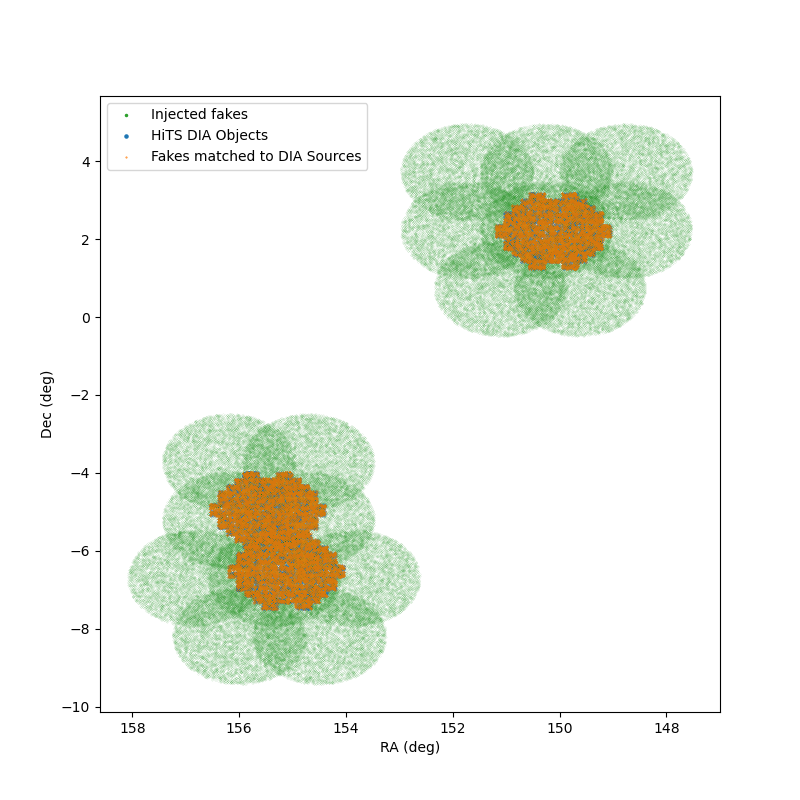

In [43]:
plt.figure(figsize=(8,8))
plt.plot(allInjectedFakes.ra*u.rad.to(u.deg), allInjectedFakes.dec*u.rad.to(u.deg),
         ls='None', marker='.', ms=0.1, label="Injected fakes", color='C2')
plt.plot(goodObj.ra, goodObj.decl, ls='None', marker='.', ms=0.15, label="HiTS DIA Objects", color='C0')
plt.plot(matchedDiaSources.ra_x*u.rad.to(u.deg), matchedDiaSources.dec*u.rad.to(u.deg), ls='None', marker='.',
         ms=0.03, label="Fakes matched to DIA Sources", color='C1')
plt.gca().invert_xaxis()
plt.xlabel("RA (deg)")
plt.ylabel("Dec (deg)")
plt.legend(markerscale=30)

In [50]:
nFakesGood = len(matchedDiaSources)
nFakesGood  # number of matched fake sources

451873

In [51]:
len(srcTable) - nFakesGood  # number of non-fake DIA Sources

731285

In [52]:
len(goodSrc)  # number of 

451113

<IPython.core.display.Javascript object>


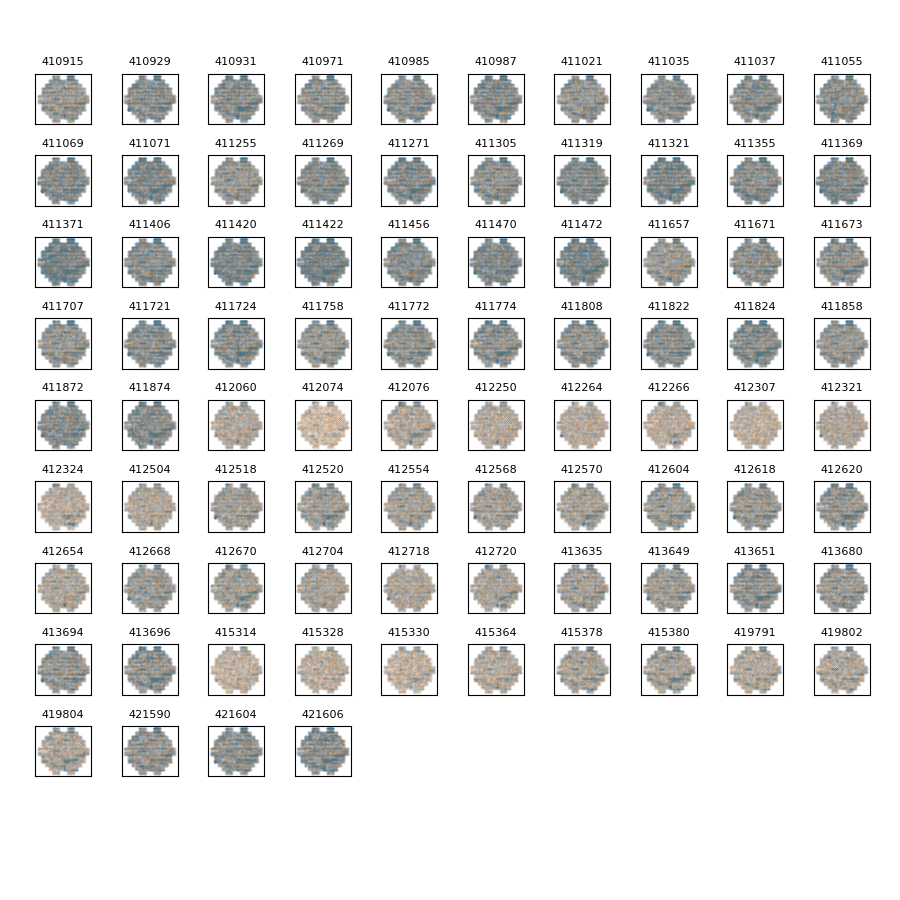

visit 410915: 13919 DIA Sources, 5393 matched injected fakes
visit 410929: 16704 DIA Sources, 5362 matched injected fakes
visit 410931: 17390 DIA Sources, 5370 matched injected fakes
visit 410971: 15571 DIA Sources, 5397 matched injected fakes
visit 410985: 16115 DIA Sources, 5371 matched injected fakes
visit 410987: 17961 DIA Sources, 5371 matched injected fakes
visit 411021: 14522 DIA Sources, 5386 matched injected fakes
visit 411035: 16028 DIA Sources, 5376 matched injected fakes
visit 411037: 16782 DIA Sources, 5379 matched injected fakes
visit 411055: 16128 DIA Sources, 5402 matched injected fakes
visit 411069: 17695 DIA Sources, 5382 matched injected fakes
visit 411071: 19277 DIA Sources, 5374 matched injected fakes
visit 411255: 13932 DIA Sources, 5386 matched injected fakes
visit 411269: 17382 DIA Sources, 5377 matched injected fakes
visit 411271: 18340 DIA Sources, 5371 matched injected fakes
visit 411305: 15820 DIA Sources, 5391 matched injected fakes
visit 411319: 18143 DIA 

In [49]:
# Plot visit-by-visit: DIA Sources (blue) and inserted fakes (orange)

sourceTablePlot = srcTable
#sourceTablePlot = goodSrc

visits = np.unique(sourceTablePlot['visit'])
nVisits = len(visits)
if np.floor(np.sqrt(nVisits)) - np.sqrt(nVisits) == 0:
    squareGridSize = int(np.sqrt(nVisits))
else:
    squareGridSize = int(np.sqrt(nVisits)) + 1

fig = plt.figure(figsize=(9, 9))
for count, visit in enumerate(np.unique(sourceTablePlot['visit'].values)):
    idx = sourceTablePlot.visit == visit
    ax = fig.add_subplot(squareGridSize, squareGridSize, count + 1, aspect='equal')
    ax.scatter(sourceTablePlot.ra[idx], sourceTablePlot.decl[idx], c='C0', marker='.', s=0.01, alpha=0.3)
    
    fakeSources = matchedDiaSources.loc[matchedDiaSources.visit == visit]
    ax.scatter(fakeSources.ra_x*u.rad.to(u.deg), fakeSources.dec*u.rad.to(u.deg),
               c='C1', marker='.', s=0.01, alpha=0.3)
    
    ax.set_title(visit, size=8)
    ax.invert_xaxis()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    print(f'visit {visit}: {len(sourceTablePlot.loc[sourceTablePlot.visit == visit])} DIA Sources, {len(fakeSources)} matched injected fakes')

fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.subplots_adjust(wspace=0)

<IPython.core.display.Javascript object>


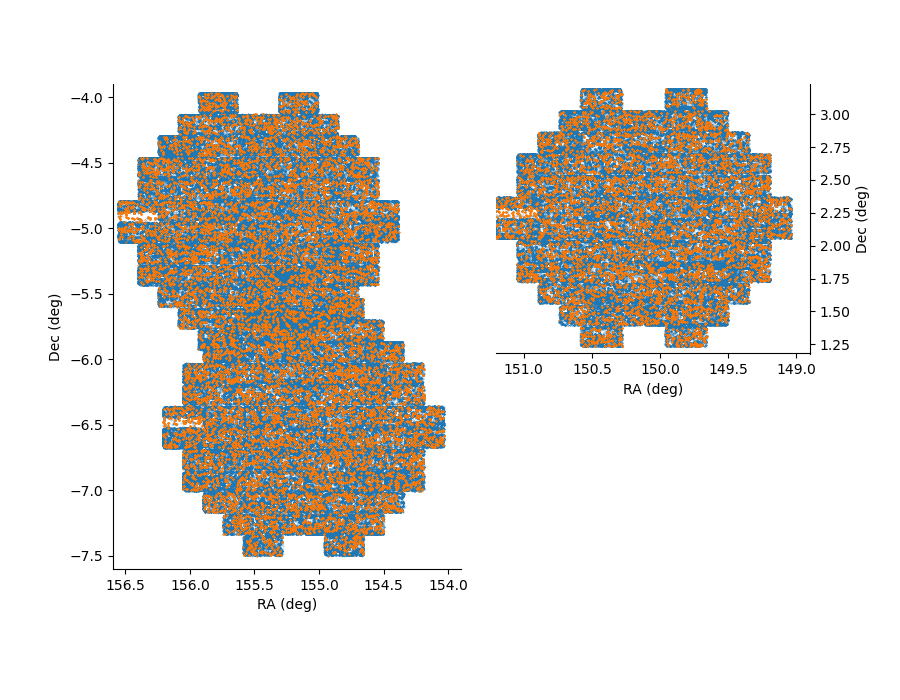

In [44]:
# Same as above but all on top of each other instead of broken out by visit
plt.figure(figsize=(9, 7))
ax1 = plt.subplot2grid((100, 100), (0, 55),
                       rowspan=50, colspan=45)  # 1 single HiTS field, on the right
ax2 = plt.subplot2grid((100, 100), (0, 0),
                       rowspan=90, colspan=50)  # 2 overlapping HiTS fields, on the left

ax1Filter = (srcTable['decl'] > -2)
ax2Filter = (~ax1Filter)

ax1.scatter(srcTable.loc[ax1Filter, 'ra'],
            srcTable.loc[ax1Filter, 'decl'],
            c='C0', s=0.1, alpha=0.5)
ax1.scatter(matchedDiaSources.ra_x*u.rad.to(u.deg), matchedDiaSources.dec*u.rad.to(u.deg), c='C1', s=0.05, alpha=0.5)
ax2.scatter(srcTable.loc[ax2Filter, 'ra'],
            srcTable.loc[ax2Filter, 'decl'],
            c='C0', s=0.1, alpha=0.5)
ax2.scatter(matchedDiaSources.ra_x*u.rad.to(u.deg), matchedDiaSources.dec*u.rad.to(u.deg), c='C1', s=0.05, alpha=0.5)

ax1.set_xlabel('RA (deg)')
ax2.set_xlabel('RA (deg)')
ax1.set_ylabel('Dec (deg)')
ax2.set_ylabel('Dec (deg)')

ax1.spines['top'].set_visible(False)
ax1.spines['left'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

ax1.set_xlim(151.2, 148.9)
ax1.set_ylim(1.18, 3.23)
ax2.set_xlim(156.6, 153.9)
ax2.set_ylim(-7.6, -3.9)

#ax1.invert_xaxis()
#ax2.invert_xaxis()

ax1.yaxis.tick_right()
ax1.yaxis.set_label_position('right')

#plt.title(title)
plt.subplots_adjust(wspace=0.1, hspace=0)

<IPython.core.display.Javascript object>


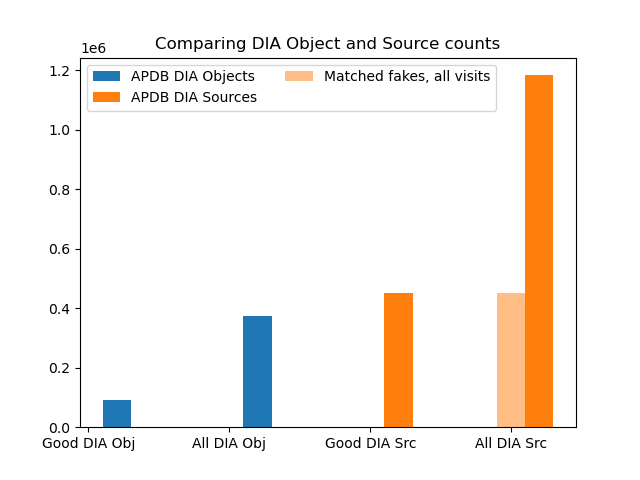

Text(0.5, 1.0, 'Comparing DIA Object and Source counts')

In [60]:
srcTable1 = matchedDiaSources
goodSrc1 = []

srcTable2 = srcTable
goodSrc2 = goodSrc
objTable2 = objTable
goodObj2 = goodObj

fig, ax = plt.subplots()
barLabels = ['Good DIA Obj', 'All DIA Obj', 'Good DIA Src', 'All DIA Src']
xbar = np.array([0, 1])
width = 0.2

# July 2022
ax.bar(xbar + width, [len(goodObj2), len(objTable2)], 
       width, label='APDB DIA Objects', color='C0')
ax.bar(xbar + 2 + width, [len(goodSrc2), len(srcTable2)],
       width, label='APDB DIA Sources', color='C1')

#ax.bar(xbar, [len(goodObj1), len(objTable1)], 
#       width, label=' ', color='C0', alpha=0.5)
ax.bar(xbar + 2, [len(goodSrc1), len(srcTable1)],
       width, label='Matched fakes, all visits', color='C1', alpha=0.5)

plt.legend(ncol=2)
ax.set_xticks([0, 1, 2, 3])
labels = ax.set_xticklabels(barLabels)
plt.title('Comparing DIA Object and Source counts')

## 4. Fakes completeness analysis

In [16]:
def completenessByBandPlot(matchedDiaSources, bandList, colorList, flux_col_suffix='_mag', doRaDecCut=False):

    completeness_byband = {}
    completeness_err_byband = {}
    bins = np.linspace(20, 26, 70)
    
    # Some filters
    wScienceOnly = matchedDiaSources['isVisitSource'] & ~matchedDiaSources['isTemplateSource']
    wMatched = matchedDiaSources['diaSourceId'] > 0
    
    if doRaDecCut:
        # Spatial cut  # probably redundant now that we do RA/Dec cut in trimFakes
        minra = matchedDiaSources.loc[wScienceOnly & wMatched,'ra'].min()
        maxra = matchedDiaSources.loc[wScienceOnly & wMatched,'ra'].max()
        mindecl = matchedDiaSources.loc[wScienceOnly & wMatched,'decl'].min()
        maxdecl = matchedDiaSources.loc[wScienceOnly & wMatched,'decl'].max()
        wRADec = (matchedDiaSources.ra < maxra) & (matchedDiaSources.ra > minra) & \
                 (matchedDiaSources.decl > mindecl) & (matchedDiaSources.decl < maxdecl)

    for band in bandList:
        wband = matchedDiaSources['filterName'] == band

        if doRaDecCut:
            matched_filter = (wMatched & wScienceOnly & wRADec & wband)
            unmatched_filter = (~wMatched & wScienceOnly & wRADec & wband)
        else:
            matched_filter = (wMatched & wScienceOnly &  wband)
            unmatched_filter = (~wMatched & wScienceOnly & wband)

        n_matched, edges = np.histogram(matchedDiaSources.loc[matched_filter, f'{band}{flux_col_suffix}'], bins=bins)
        n_unmatched, edges = np.histogram(matchedDiaSources.loc[unmatched_filter, f'{band}{flux_col_suffix}'], bins=bins)

        ntot = n_matched + n_unmatched
        nmatched_err = np.sqrt(n_matched)
        completeness_byband[band] = n_matched/ntot

        # Attempt to compute some kind of error
        ntot_err = np.sqrt(ntot) # compute on total to keep Poisson errors in gaussian regime
        completeness_err_byband[band] = completeness_byband[band] * \
                                        np.sqrt((nmatched_err/n_matched)**2. + (ntot_err/ntot)**2.)
    
    plt.figure()
    plt.title('Spatial distribution of matched DIA Sources')
    plt.scatter(matchedDiaSources.loc[wScienceOnly & wMatched,'ra'], \
                matchedDiaSources.loc[wScienceOnly & wMatched,'decl'],
                marker='x', s=3, label='Matched science fake')
    plt.scatter(matchedDiaSources.loc[wScienceOnly & ~wMatched,'ra'], \
                matchedDiaSources.loc[wScienceOnly & ~wMatched,'decl'],
                marker='.', s=3, label='Unmatched science fake')
    #plt.scatter(matchedDiaSources.loc[wScienceOnly & wRADec,'ra'], \
    #            matchedDiaSources.loc[wScienceOnly & wRADec,'decl'],marker='+')
    plt.legend()
    
    if len(bandList) > 1:
        fig, axs = plt.subplots(3, 2, figsize=(9, 12))
        axG = axs[0, 0]
        axR = axs[0, 1]
        axI = axs[1, 0]
        axZ = axs[1, 1]
        axY = axs[2, 0]
        #axHits = axs[2, 1]
        ax0 = axs[2, 1]
        ax0.axis('off')
        axList = [axG, axR, axI, axZ, axY]
        colorList = ['C2', 'C1', 'C3', 'C5', 'k']
        xlim = (20,26)
        ylim = (0, 1)
        plt.setp(axs, xlim=xlim, ylim=ylim)
        fig.suptitle(f'Completeness')
        for ax, band, color in zip(axList, bandList, colorList):
            ax.errorbar(bins[0:-1], completeness_byband[band], completeness_err_byband[band], color=color)
    
    plt.figure(figsize=(8, 6))
    for band, color in zip(bandList, colorList):
        plt.errorbar(bins[0:-1], completeness_byband[band], completeness_err_byband[band], color=color, label=band)
        #plt.axvline(median_limmag.loc[band,'maglim6'], color=color, ls=':')
        #plt.axvspan(p25_limmag.loc[band,'maglim6'], p75_limmag.loc[band,'maglim6'],
        #            facecolor=color, alpha=0.2, edgecolor='none')
    plt.axhline(.9, ls='--', color='0.75')#, label='90%')
    plt.legend(loc='lower left')
    plt.xlabel('Injected magnitude')
    plt.ylabel('Fractional completeness')
    plt.title('Completeness for sources injected into science (visit) images')

<IPython.core.display.Javascript object>


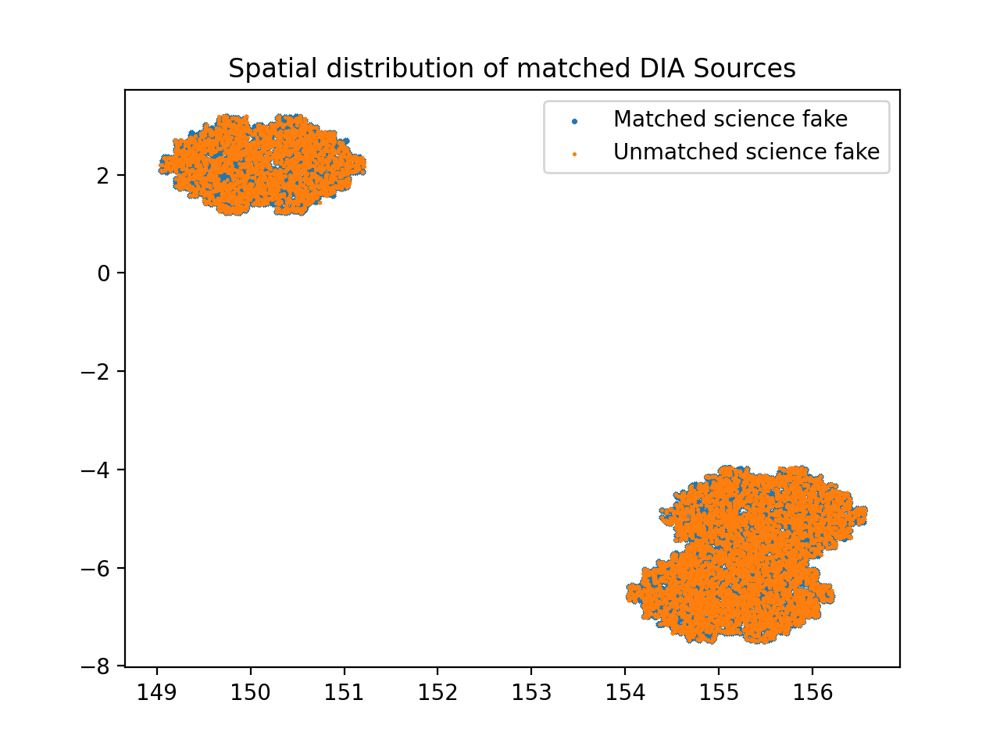

<IPython.core.display.Javascript object>


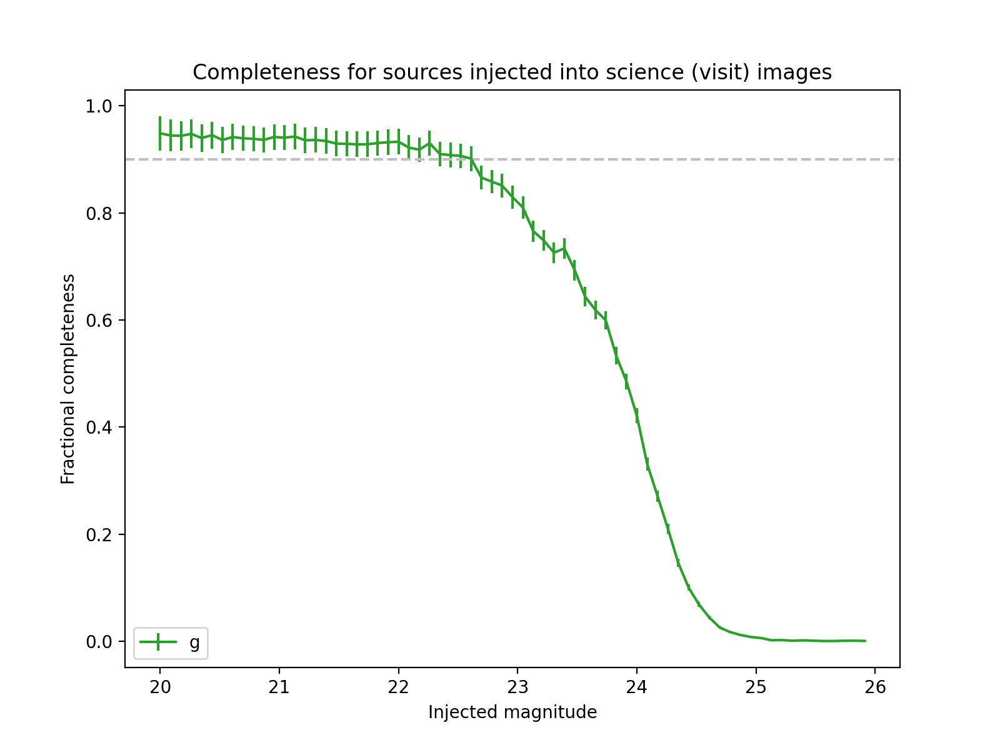

In [17]:
bandList = ['g']
colorList = ['C2']

completenessByBandPlot(matchedDiaSources, bandList, colorList,
                       flux_col_suffix='_mag', doRaDecCut=False)

## 5. SNR distributions

For both difference image fluxes (psFlux) and forced source photometry fluxes (totFlux)

In [28]:
# SNR is basically just flux/fluxErr for our purposes
# There is now an actual `snr` column in the DiaSource table too, even better!

<IPython.core.display.Javascript object>


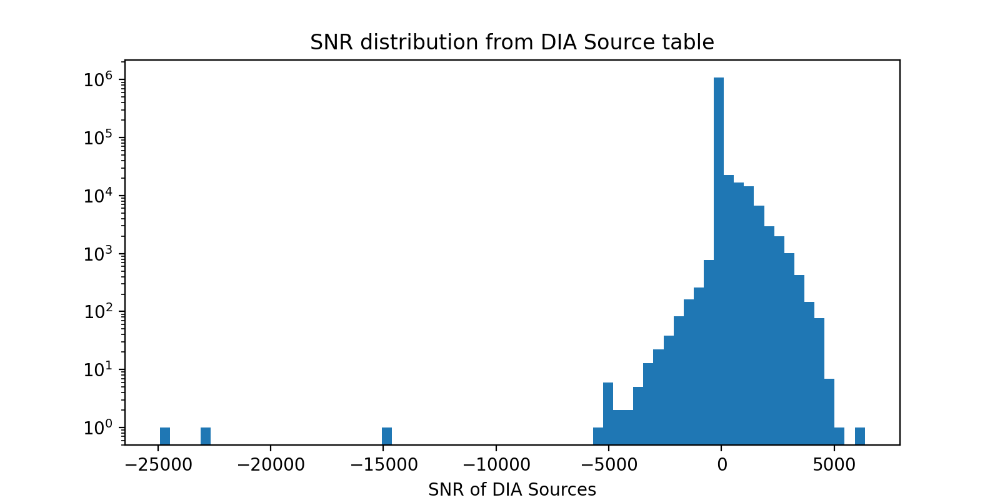

Text(0.5, 0, 'SNR of DIA Sources')

In [28]:
plt.figure(figsize=(8,4))
plt.yscale('log')
snrHist = plt.hist(srcTable.snr, bins=70)
plt.title('SNR distribution from DIA Source table')
plt.xlabel('SNR of DIA Sources')
#plt.gca().set_xlim(-6000, 6000)

In [25]:
# Before I knew about that column existing, there was always this tried and true estimate
srcTable['psFluxSNR'] = srcTable.psFlux / srcTable.psFluxErr
srcTable['totFluxSNR'] = srcTable.totFlux / srcTable.totFluxErr

<IPython.core.display.Javascript object>


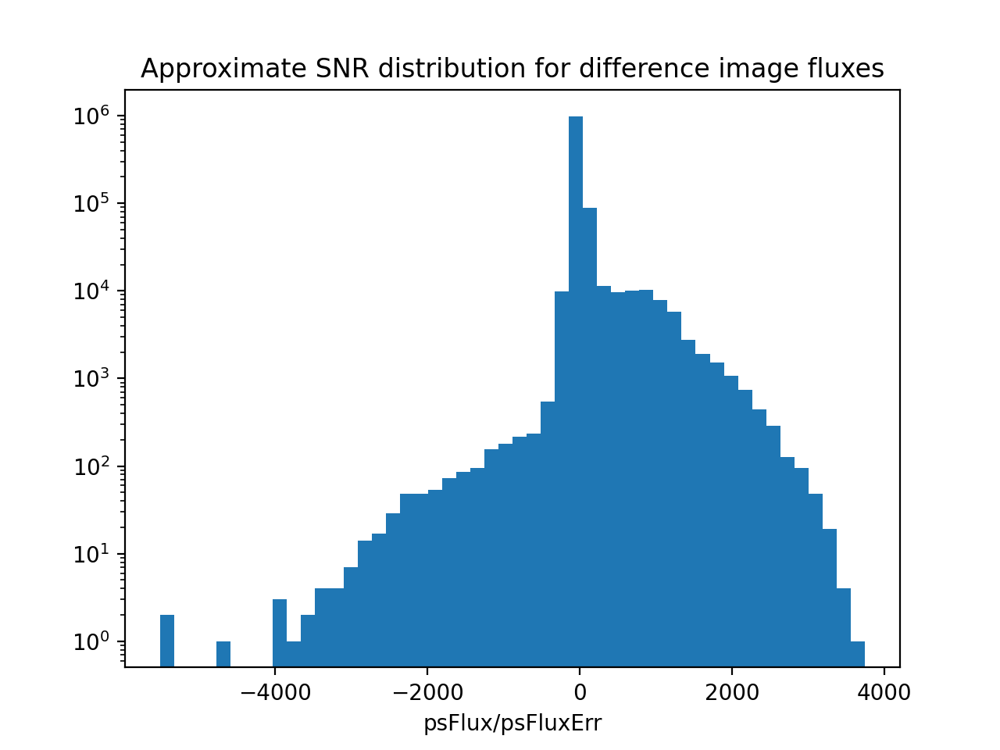

Text(0.5, 0, 'psFlux/psFluxErr')

In [29]:
plt.figure()
plt.yscale('log')
psFluxHist = plt.hist(srcTable.psFluxSNR, bins=50)
plt.title('Approximate SNR distribution for difference image fluxes')
plt.xlabel('psFlux/psFluxErr')

<IPython.core.display.Javascript object>


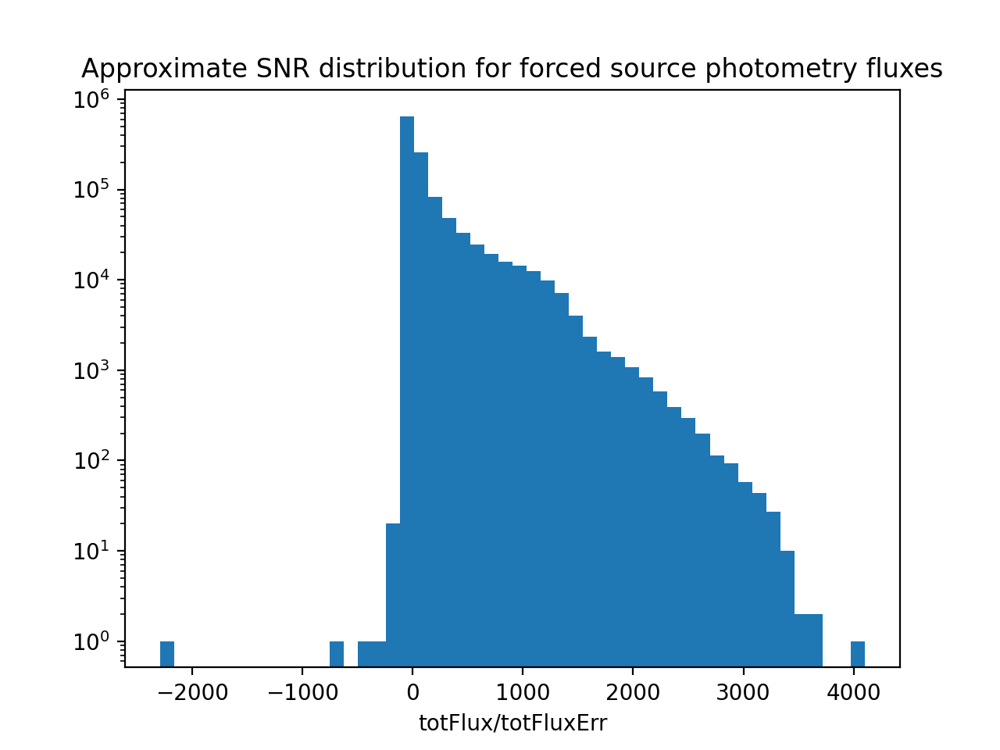

Text(0.5, 0, 'totFlux/totFluxErr')

In [30]:
plt.figure()
plt.yscale('log')
totFluxHist = plt.hist(srcTable.totFluxSNR, bins=50)
plt.title('Approximate SNR distribution for forced source photometry fluxes')
plt.xlabel('totFlux/totFluxErr')

## 6. Troubleshooting appendix
### Cells below were used to troubleshoot the "take1" run to figure out WTF was going on

Saving for posterity in case similar troubleshooting is needed in the future only

In [ ]:
schema = 'mrawls_DM34710'  # "take1"
#collection = 'u/mrawls/DM-34710-hits2015-ApPipeWithFakes'  # take1
objTable, srcTable, goodObj, goodSrc = pla.loadTables(repo,
                                                      dbType='postgres',
                                                      dbName='lsstdevapdb1',
                                                      schema=schema,
                                                      gen='gen3',
                                                      instrument=instrument,
                                                      badFlagList=badFlagList)

In [ ]:
srcTable = pla.addVisitCcdToSrcTable(srcTable, instrument=instrument, gen='gen3', butler=butler)
flagTable, srcTableFlags, flagFilter, goodSrc, goodObj = pla.makeSrcTableFlags(srcTable, objTable,
                                                                               badFlagList=badFlagList,
                                                                               gen='gen3',
                                                                               instrument=instrument,
                                                                               repo=repo)

<IPython.core.display.Javascript object>


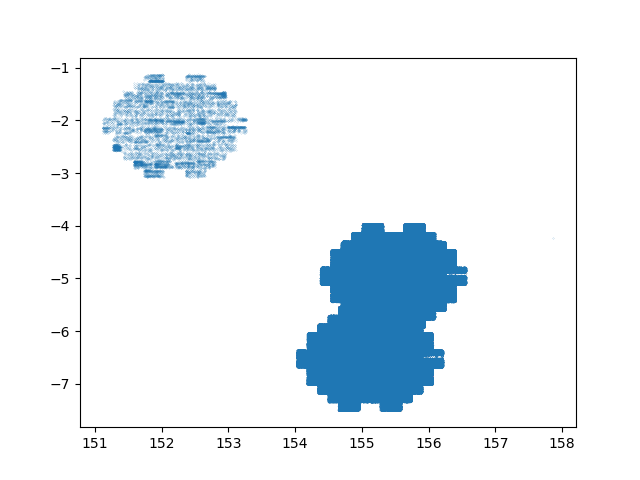

In [11]:
# this plot was made with the "take1" postgres schema `mrawls_DM34710` and shows the errant visit 289777 in the wrong spot
plt.figure()
#plt.plot(goodObj.ra, goodObj.decl, marker='.', ms=0.2, ls='None')
plt.plot(srcTable.ra, srcTable.decl, marker='.', ms=0.2, ls='None')

<IPython.core.display.Javascript object>


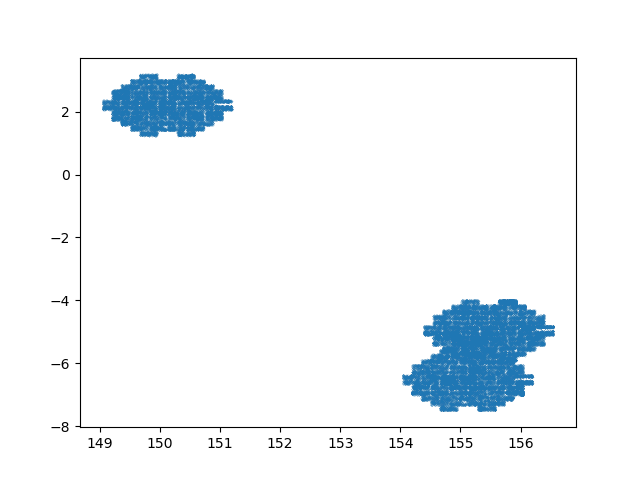

In [24]:
# this plot shows where the solo field actually should be
plt.figure()
plt.plot(goodObj_old.ra, goodObj_old.decl, marker='.', ms=0.2, ls='None')

In [8]:
nMissing = 0
for visit in visitList2015:
    #datasetType = 'fakes_goodSeeingDiff_diaSrcTable'
    #datasetType = 'fakes_goodSeeingDiff_templateExp.bbox'
    #datasetType = 'calexp.bbox'
    detector = 48
    try:
        dataset = butler.get(datasetType, collections='u/mrawls/DM-34710-hits2015-ApPipeWithFakes',
                             instrument=instrument, visit=visit, detector=detector)
    except:
        print(f'No {datasetType} found for visit {visit}')
        nMissing += 1
        continue
    else:
        print(f'{visit}')
print(nMissing)

No fakes_goodSeeingDiff_templateExp.bbox found for visit 410915
410929
410931
No fakes_goodSeeingDiff_templateExp.bbox found for visit 410971
410985
410987
No fakes_goodSeeingDiff_templateExp.bbox found for visit 411021
411035
411037
No fakes_goodSeeingDiff_templateExp.bbox found for visit 411055
411069
411071
No fakes_goodSeeingDiff_templateExp.bbox found for visit 411255
411269
411271
No fakes_goodSeeingDiff_templateExp.bbox found for visit 411305
411319
411321
No fakes_goodSeeingDiff_templateExp.bbox found for visit 411355
411369
411371
No fakes_goodSeeingDiff_templateExp.bbox found for visit 411406
411420
411422
No fakes_goodSeeingDiff_templateExp.bbox found for visit 411456
411470
411472
No fakes_goodSeeingDiff_templateExp.bbox found for visit 411657
411671
411673
No fakes_goodSeeingDiff_templateExp.bbox found for visit 411707
411721
411724
No fakes_goodSeeingDiff_templateExp.bbox found for visit 411758
411772
411774
No fakes_goodSeeingDiff_templateExp.bbox found for visit 411808


In [6]:
visitList2015 = [410915, 410929, 410931, 410971, 410985, 410987, 411021, 411035, 411037, 411055,
                 411069, 411071, 411255, 411269, 411271, 411305, 411319, 411321, 411355, 411369,
                 411371, 411406, 411420, 411422, 411456, 411470, 411472, 411657, 411671, 411673,
                 411707, 411721, 411724, 411758, 411772, 411774, 411808, 411822, 411824, 411858,
                 411872, 411874, 412060, 412074, 412076, 412250, 412264, 412266, 412307, 412321,
                 412324, 412504, 412518, 412520, 412554, 412568, 412570, 412604, 412618, 412620,
                 412654, 412668, 412670, 412704, 412718, 412720, 413635, 413649, 413651, 413680,
                 413694, 413696, 415314, 415328, 415330, 415364, 415378, 415380, 419791, 419802,
                 419804, 421590, 421604, 421606]

In [24]:
srcTable.columns

Index(['diaSourceId', 'diaObjectId', 'ra', 'decl', 'ccdVisitId', 'midPointTai',
       'apFlux', 'psFlux', 'apFluxErr', 'psFluxErr', 'totFlux', 'totFluxErr',
       'x', 'y', 'ixxPSF', 'iyyPSF', 'ixyPSF', 'flags', 'filterName', 'visit',
       'ccd'],
      dtype='object')

In [20]:
print(np.min(srcTable.midPointTai))
print(np.max(srcTable.midPointTai))

56717.04068065609
57095.19322941513


In [21]:
print(np.min(srcTable_old.midPointTai))
print(np.max(srcTable_old.midPointTai))

57070.141865742786
57095.19322941513


In [22]:
print(np.min(srcTable.ra))
print(np.max(srcTable.ra))
print(np.min(srcTable.decl))
print(np.max(srcTable.decl))

151.11656892579435
157.8719395675368
-7.5042126088656955
-1.125815212780931


In [23]:
print(np.min(srcTable_old.ra))
print(np.max(srcTable_old.ra))
print(np.min(srcTable_old.decl))
print(np.max(srcTable_old.decl))

149.03756833029954
156.55923745545553
-7.497357596623649
3.192592672559456


In [30]:
sorted(set(srcTable.visit))

[288934,
 288935,
 288975,
 288976,
 289015,
 289016,
 289055,
 289056,
 289160,
 289161,
 289201,
 289202,
 289242,
 289243,
 289283,
 289284,
 289367,
 289368,
 289408,
 289409,
 289449,
 289450,
 289492,
 289493,
 289572,
 289573,
 289613,
 289614,
 289655,
 289656,
 289696,
 289697,
 289782,
 289783,
 289818,
 289820,
 289828,
 289870,
 289871,
 410929,
 410931,
 410985,
 410987,
 411035,
 411037,
 411069,
 411071,
 411269,
 411271,
 411319,
 411321,
 411369,
 411371,
 411420,
 411422,
 411470,
 411472,
 411671,
 411673,
 411721,
 411724,
 411772,
 411774,
 411822,
 411824,
 411872,
 411874,
 412074,
 412076,
 412264,
 412266,
 412321,
 412324,
 412518,
 412520,
 412568,
 412570,
 412618,
 412620,
 412668,
 412670,
 412718,
 412720,
 413649,
 413651,
 413694,
 413696,
 415328,
 415330,
 415378,
 415380,
 419802,
 419804,
 421604,
 421606]

In [31]:
sorted(set(srcTable_old.visit))

[410915,
 410929,
 410931,
 410971,
 410985,
 410987,
 411021,
 411035,
 411037,
 411055,
 411069,
 411071,
 411255,
 411269,
 411271,
 411305,
 411319,
 411321,
 411355,
 411369,
 411371,
 411406,
 411420,
 411422,
 411456,
 411470,
 411472,
 411657,
 411671,
 411673,
 411707,
 411721,
 411724,
 411758,
 411772,
 411774,
 411808,
 411822,
 411824,
 411858,
 411872,
 411874,
 412060,
 412074,
 412076,
 412250,
 412264,
 412266,
 412307,
 412321,
 412324,
 412504,
 412518,
 412520,
 412554,
 412568,
 412570,
 412604,
 412618,
 412620,
 412654,
 412668,
 412670,
 412704,
 412718,
 412720,
 413635,
 413649,
 413651,
 413680,
 413694,
 413696,
 415314,
 415328,
 415330,
 415364,
 415378,
 415380,
 419791,
 419802,
 419804,
 421590,
 421604,
 421606]

In [39]:
print(np.min(srcTable.loc[srcTable.visit > 400000].ra))
print(np.max(srcTable.loc[srcTable.visit > 400000].ra))

154.03113152250285
156.5592318503306


In [40]:
print(np.min(srcTable.loc[srcTable.visit > 400000].decl))
print(np.max(srcTable.loc[srcTable.visit > 400000].decl))

-7.49732125209243
-3.968243485746745


<IPython.core.display.Javascript object>


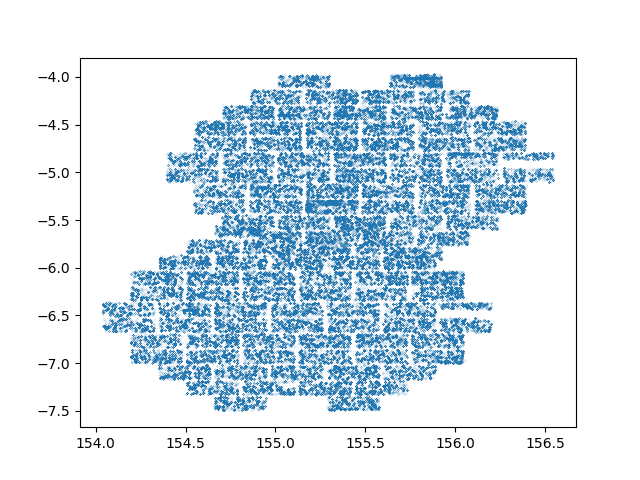

In [46]:
plt.figure()
plt.plot(goodSrc.loc[goodSrc.visit > 400000].ra, goodSrc.loc[goodSrc.visit > 400000].decl,
         marker='.', ms=0.2, ls='None')

<IPython.core.display.Javascript object>


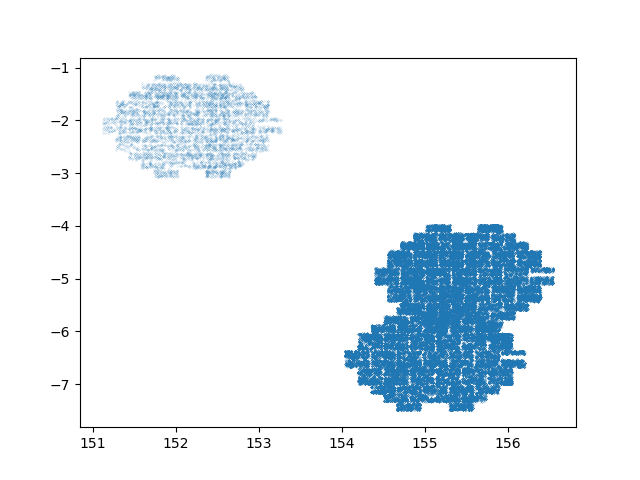

In [45]:
plt.figure()
plt.plot(goodSrc.loc[goodSrc.visit < 400000].ra, goodSrc.loc[goodSrc.visit < 400000].decl,
         marker='.', ms=0.2, ls='None')

10054


<IPython.core.display.Javascript object>


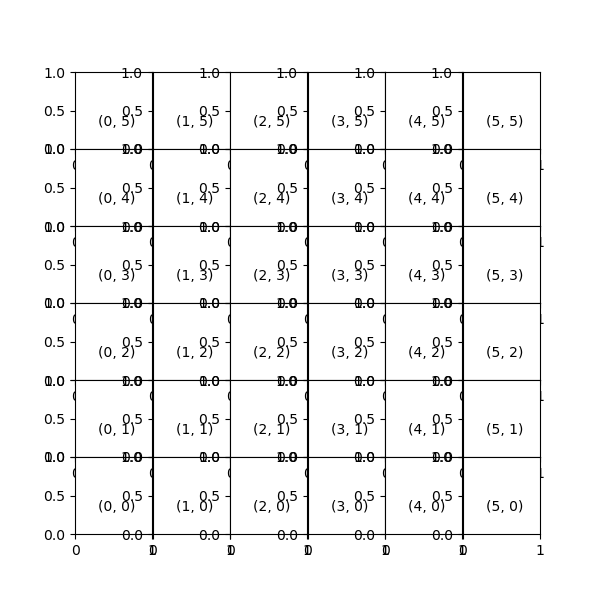

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrie

<IPython.core.display.Javascript object>


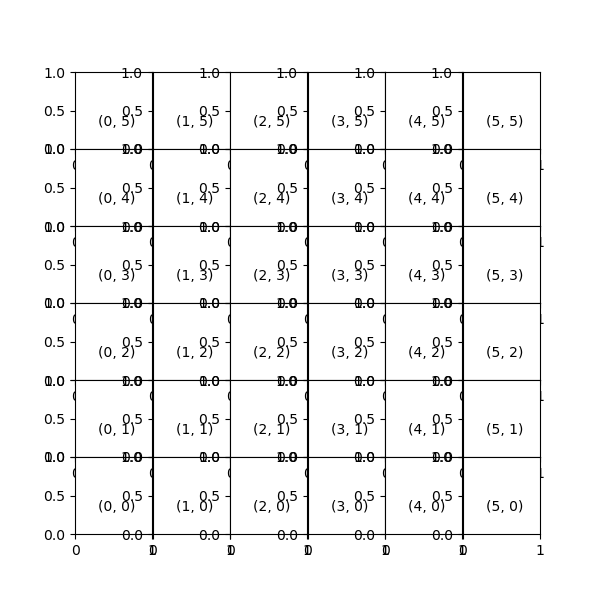

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrie

<IPython.core.display.Javascript object>


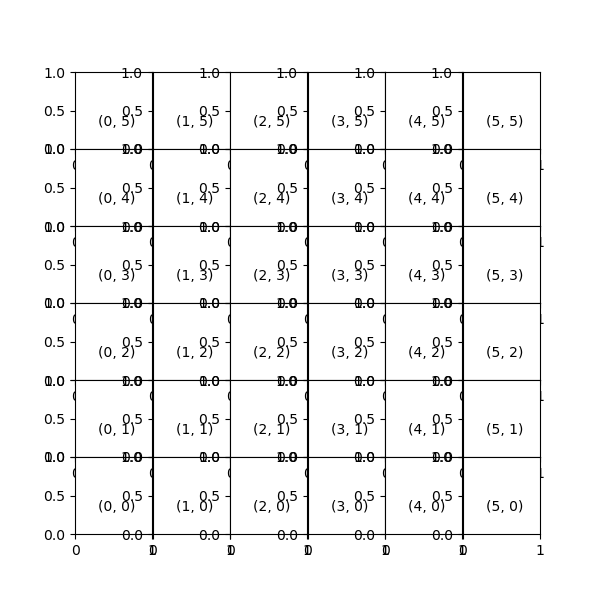

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrie

<IPython.core.display.Javascript object>


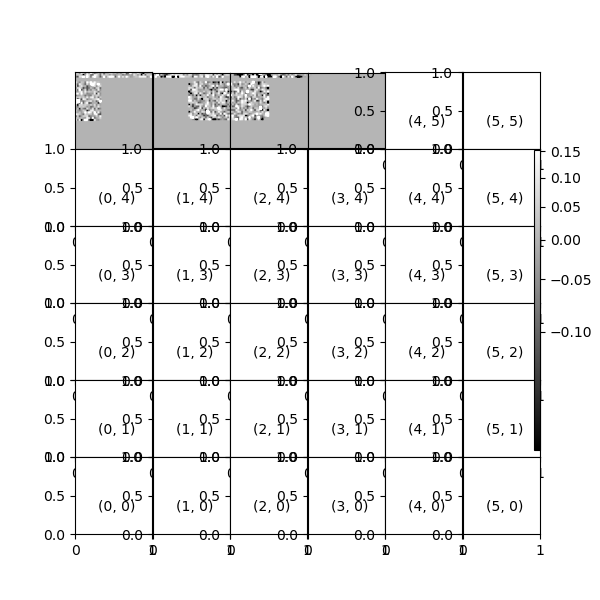

Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrieve data for patch (4, 5)
Failed to retrieve data for patch (4, 4)
Failed to retrieve data for patch (4, 3)
Failed to retrieve data for patch (4, 2)
Failed to retrie

<IPython.core.display.Javascript object>


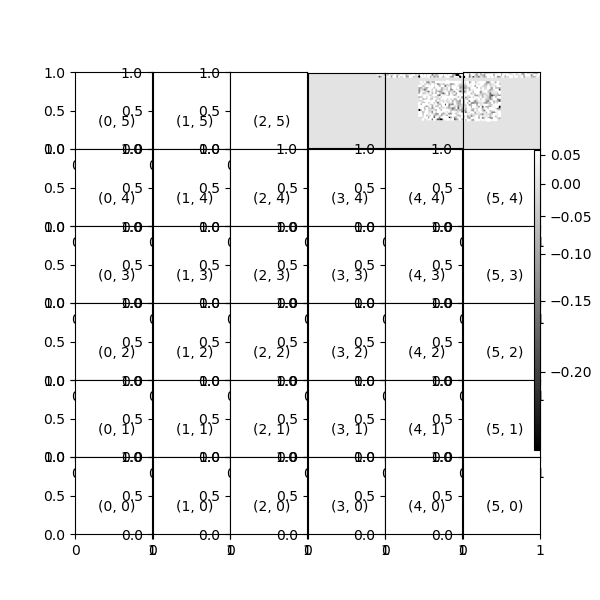

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrieve data for patch (4, 4)
Failed to retrie

<IPython.core.display.Javascript object>


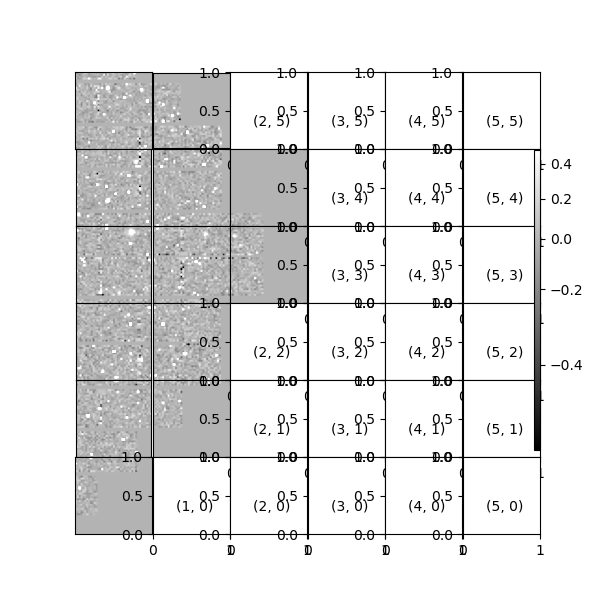

Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrieve data for patch (4, 5)
Failed to retrieve data for patch (4, 4)
Failed to retrieve data for patch (4, 3)
Failed to retrieve data for patch (4, 2)
Failed to retrieve data for patch (4, 1)
Failed to retrieve data for patch (4, 0)
Failed to retrieve data for patch (5, 5)
Failed to retrieve data for patch (5, 4)
Failed to retrieve data for patch (5, 3)
Failed to retrieve data for patch (5, 2)
Failed to retrieve data for patch (5, 1)
Failed to retrieve data for patch (5, 0)
8363


<IPython.core.display.Javascript object>


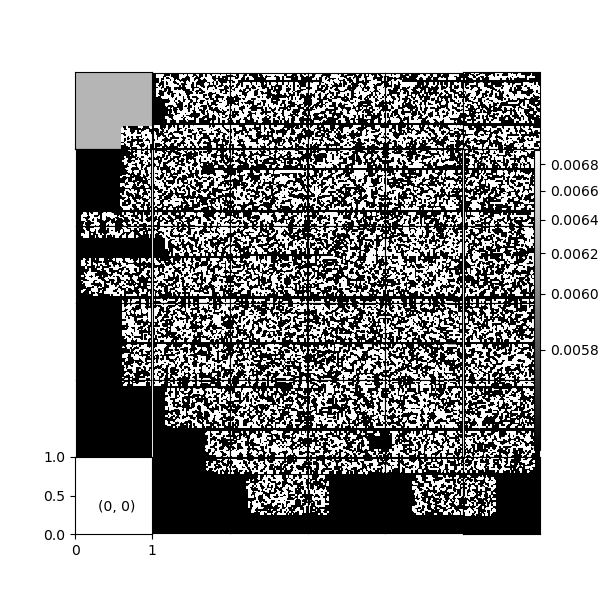

Failed to retrieve data for patch (0, 0)
8364


<IPython.core.display.Javascript object>


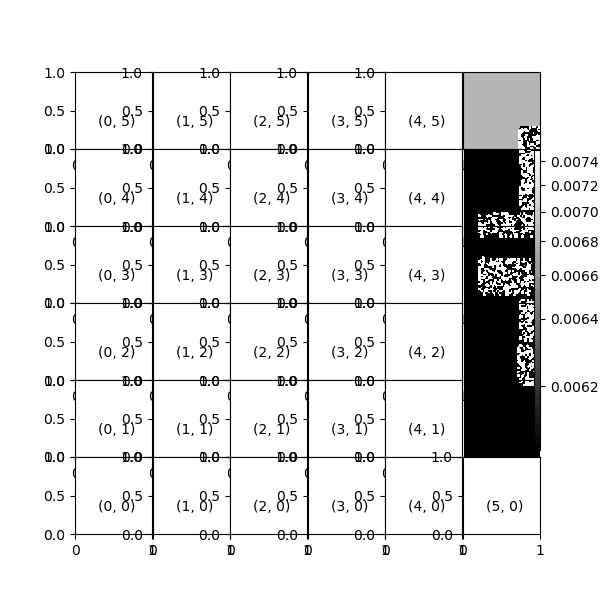

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrie

<IPython.core.display.Javascript object>


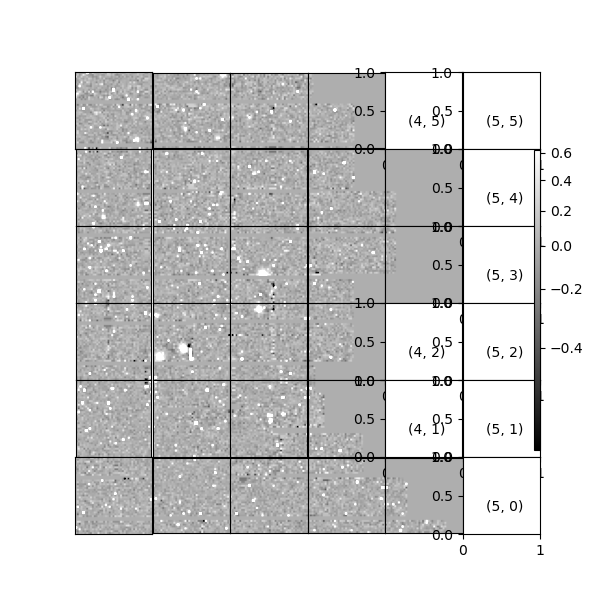

Failed to retrieve data for patch (4, 5)
Failed to retrieve data for patch (4, 2)
Failed to retrieve data for patch (4, 1)
Failed to retrieve data for patch (5, 5)
Failed to retrieve data for patch (5, 4)
Failed to retrieve data for patch (5, 3)
Failed to retrieve data for patch (5, 2)
Failed to retrieve data for patch (5, 1)
Failed to retrieve data for patch (5, 0)
8605


<IPython.core.display.Javascript object>


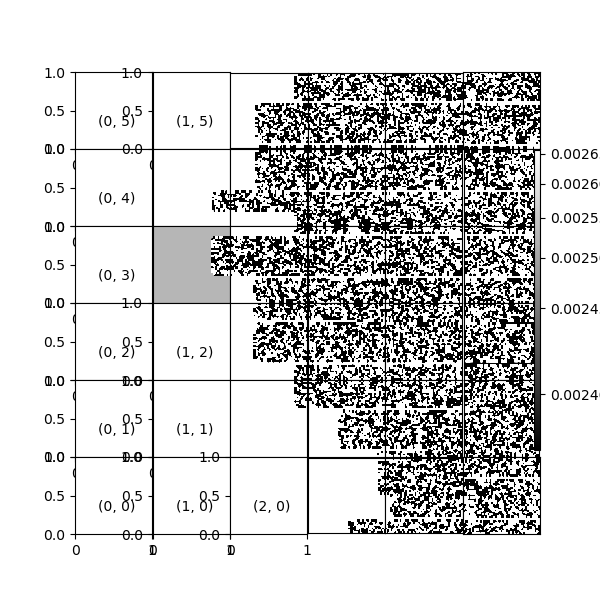

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 0)
8844


<IPython.core.display.Javascript object>


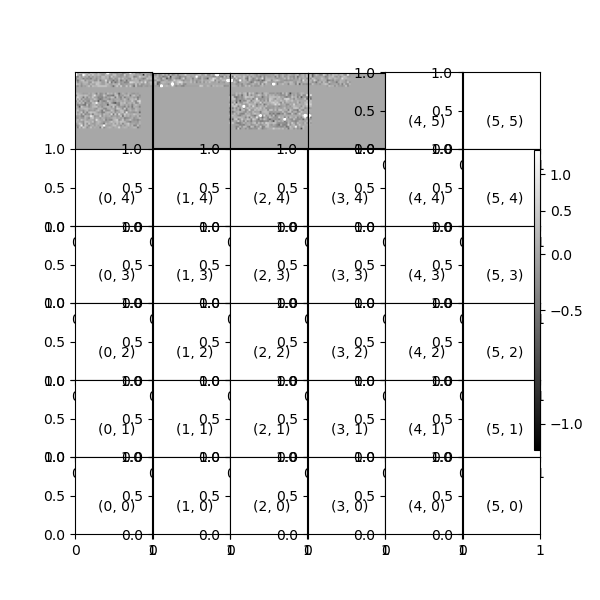

Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrieve data for patch (4, 5)
Failed to retrieve data for patch (4, 4)
Failed to retrieve data for patch (4, 3)
Failed to retrieve data for patch (4, 2)
Failed to retrie

<IPython.core.display.Javascript object>


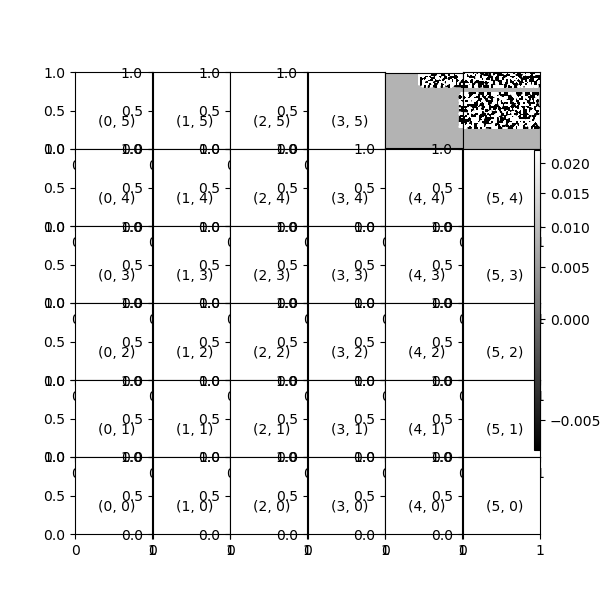

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrie

<IPython.core.display.Javascript object>


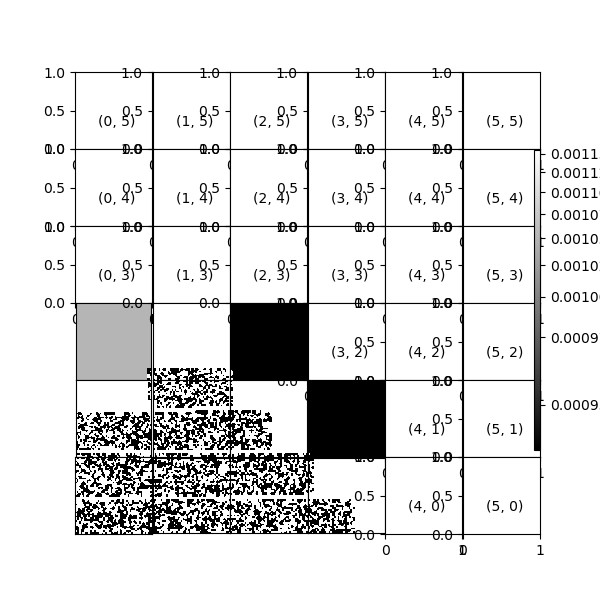

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (4, 5)
Failed to retrieve data for patch (4, 4)
Failed to retrieve data for patch (4, 3)
Failed to retrieve data for patch (4, 2)
Failed to retrieve data for patch (4, 1)
Failed to retrieve data for patch (4, 0)
Failed to retrieve data for patch (5, 5)
Failed to retrieve data for patch (5, 4)
Failed to retrieve data for patch (5, 3)
Failed to retrieve data for patch (5, 2)
Failed to retrieve data for patch (5, 1)
Failed to retrie

<IPython.core.display.Javascript object>


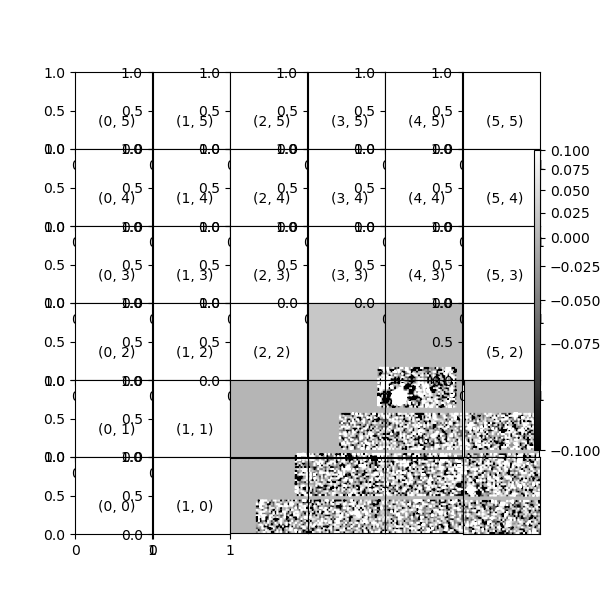

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (4, 5)
Failed to retrieve data for patch (4, 4)
Failed to retrieve data for patch (4, 3)
Failed to retrieve data for patch (5, 5)
Failed to retrieve data for patch (5, 4)
Failed to retrie

<IPython.core.display.Javascript object>


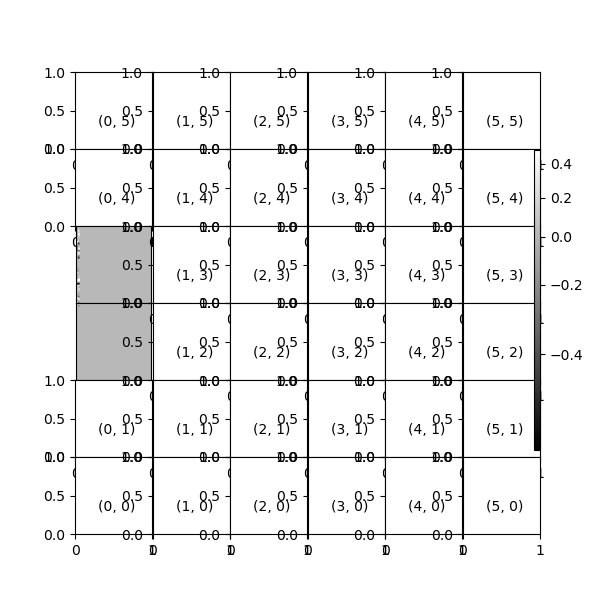

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrieve data for patch (4, 5)
Failed to retrieve data for patch (4, 4)
Failed to retrie

<IPython.core.display.Javascript object>


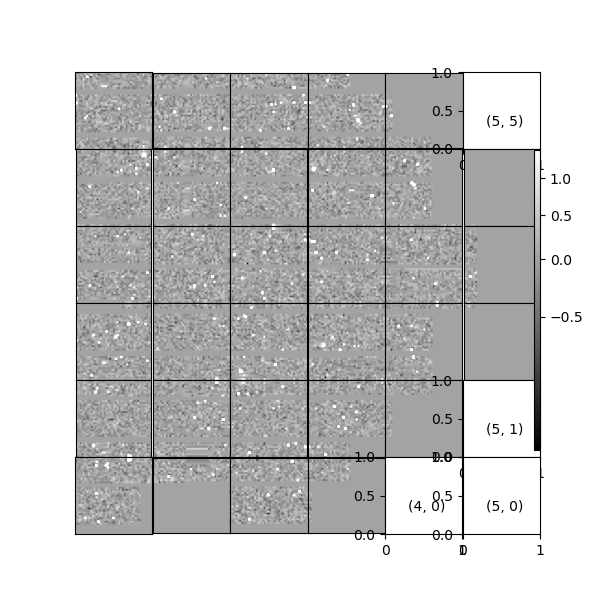

Failed to retrieve data for patch (4, 0)
Failed to retrieve data for patch (5, 5)
Failed to retrieve data for patch (5, 1)
Failed to retrieve data for patch (5, 0)
9087


<IPython.core.display.Javascript object>


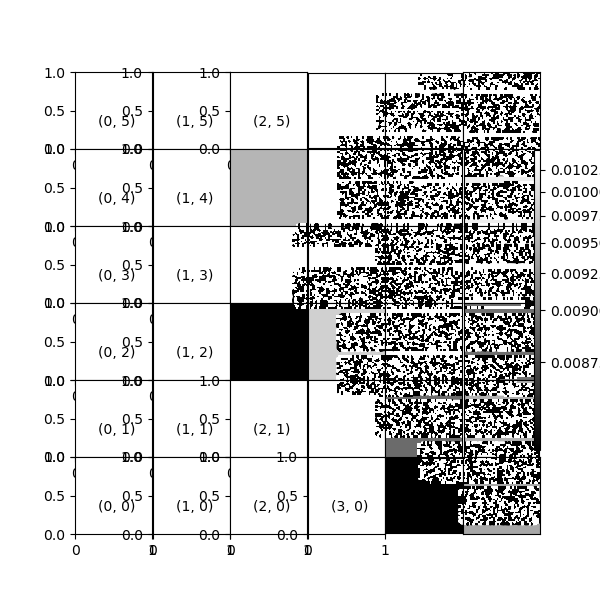

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 0)
9328


<IPython.core.display.Javascript object>


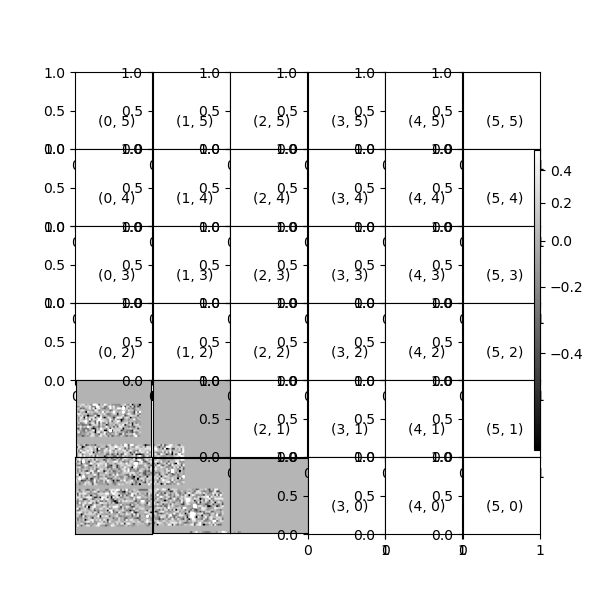

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrieve data for patch (4, 5)
Failed to retrieve data for patch (4, 4)
Failed to retrieve data for patch (4, 3)
Failed to retrieve data for patch (4, 2)
Failed to retrieve data for patch (4, 1)
Failed to retrie

<IPython.core.display.Javascript object>


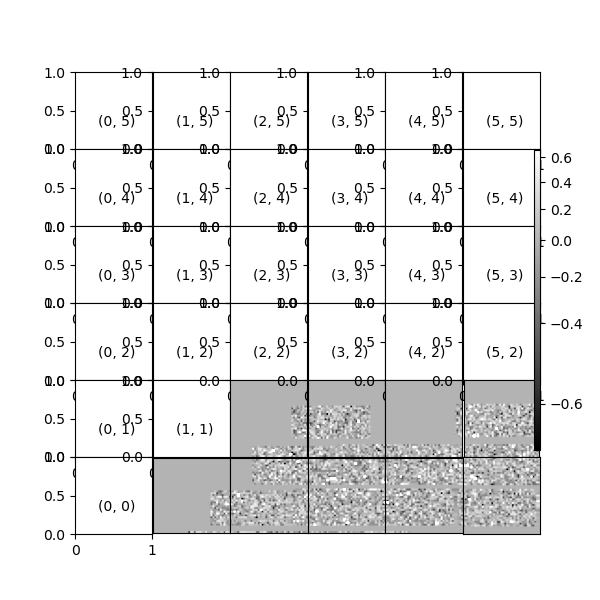

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (4, 5)
Failed to retrieve data for patch (4, 4)
Failed to retrieve data for patch (4, 3)
Failed to retrieve data for patch (4, 2)
Failed to retrieve data for patch (5, 5)
Failed to retrie

<IPython.core.display.Javascript object>


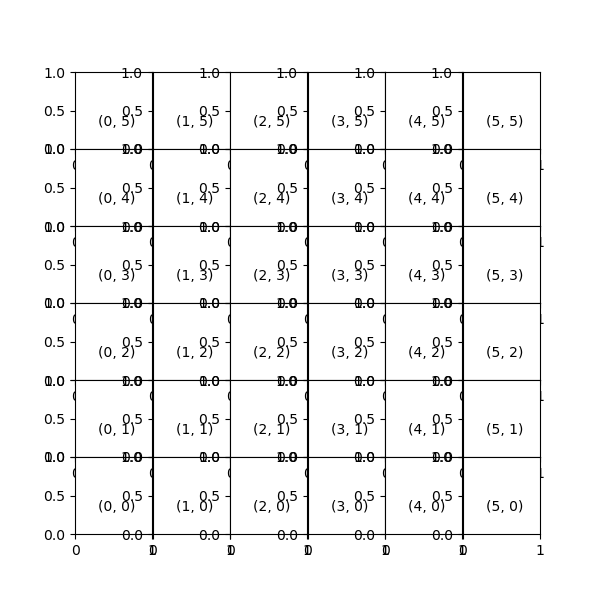

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrie

/project/mrawls/ap_pipe-notebooks/coaddAnalysis.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(nx, ny), constrained_layout=False)


<IPython.core.display.Javascript object>


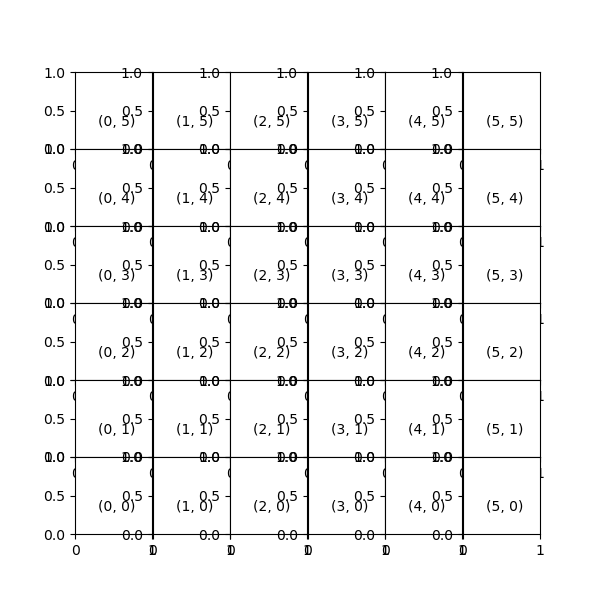

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrie

<IPython.core.display.Javascript object>


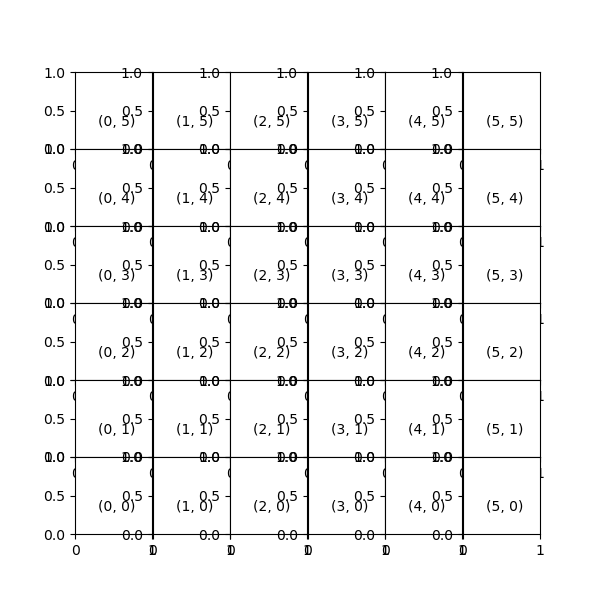

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrie

<IPython.core.display.Javascript object>


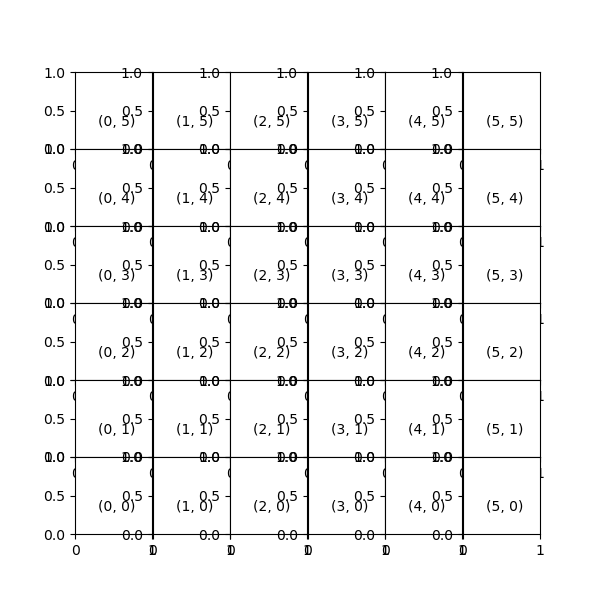

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrie

<IPython.core.display.Javascript object>


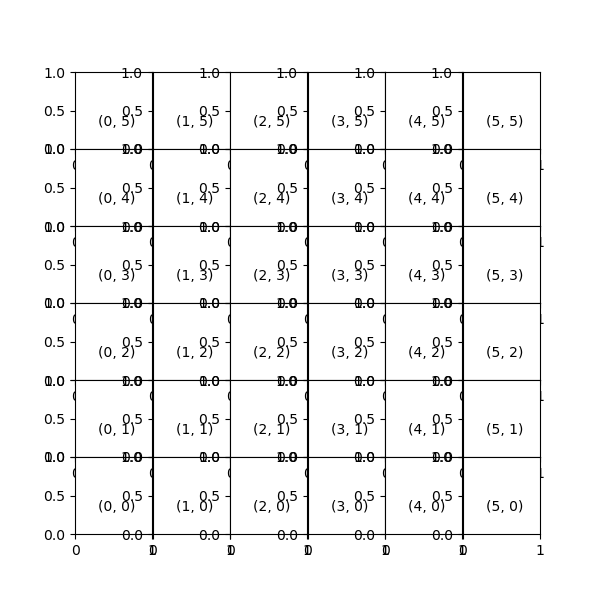

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrie

In [5]:
tractList = [10054, 10055, 10056, 8122, 8123, 8362, 8363, 8364, 8604, 8605, 8844,
             8845, 8846, 8847, 9085, 9086, 9087, 9328, 9329, 9570, 9571, 9812, 9813, 9814]
patchList = np.arange(0, 36)
for tract in tractList:
    print(tract)
    try:
        coa.mosaicCoadd(repo, patchList, band='g', tractIndex=tract, collections='u/mrawls/DM-34710-hits2015-ApPipeWithFakes',
                        skymapName=skymap, instrument=instrument, coaddName='goodSeeingCoadd')
    except UnboundLocalError:  # there is a bug in mosaicCoadd if no data is found
        continue

10054


<IPython.core.display.Javascript object>


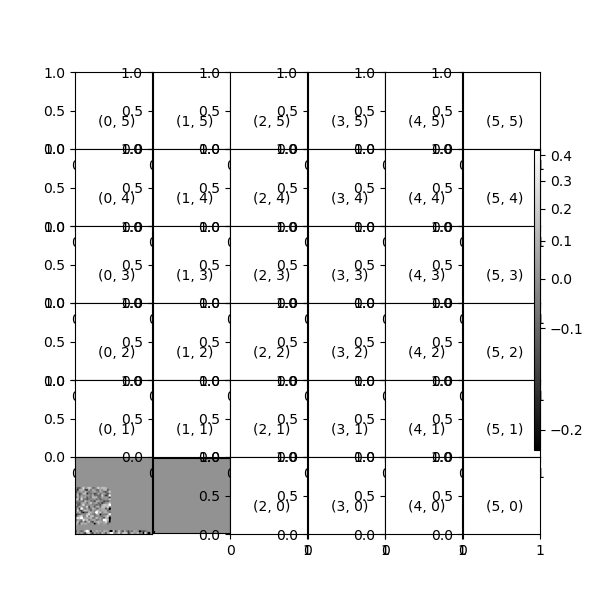

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrieve data for patch (4, 5)
Failed to retrieve data for patch (4, 4)
Failed to retrie

<IPython.core.display.Javascript object>


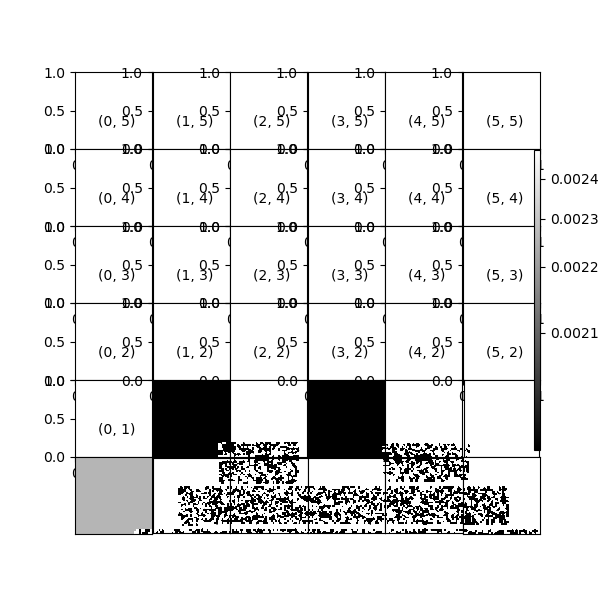

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (4, 5)
Failed to retrieve data for patch (4, 4)
Failed to retrieve data for patch (4, 3)
Failed to retrieve data for patch (4, 2)
Failed to retrieve data for patch (5, 5)
Failed to retrieve data for patch (5, 4)
Failed to retrieve data for patch (5, 3)
Failed to retrie

<IPython.core.display.Javascript object>


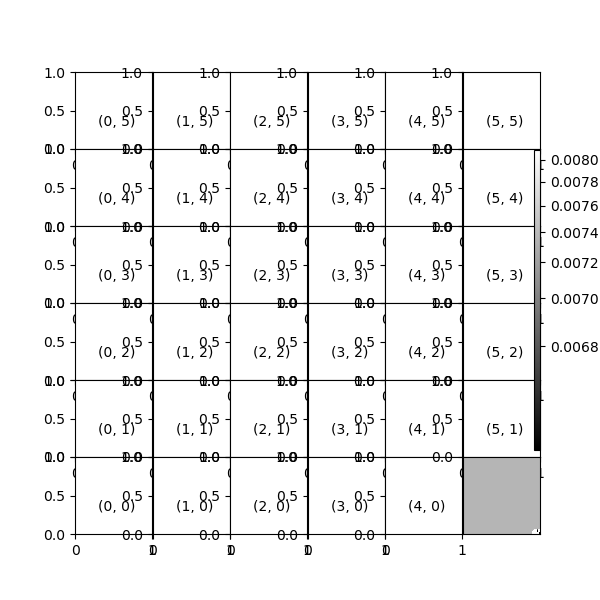

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrie

<IPython.core.display.Javascript object>


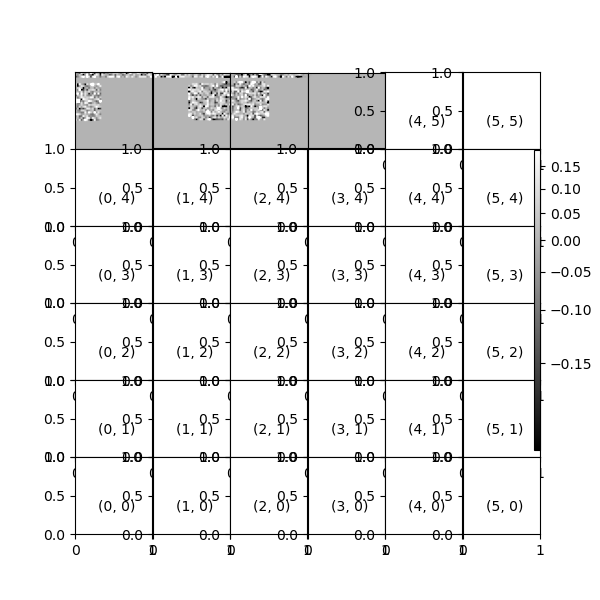

Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrieve data for patch (4, 5)
Failed to retrieve data for patch (4, 4)
Failed to retrieve data for patch (4, 3)
Failed to retrieve data for patch (4, 2)
Failed to retrie

<IPython.core.display.Javascript object>


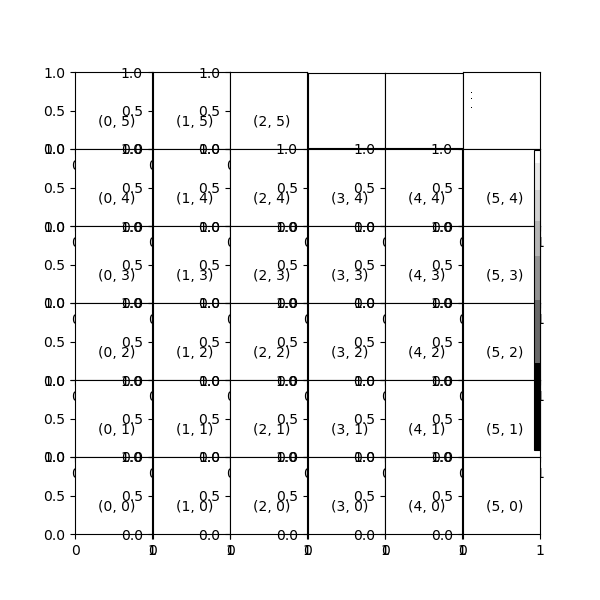

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrieve data for patch (4, 4)
Failed to retrie

<IPython.core.display.Javascript object>


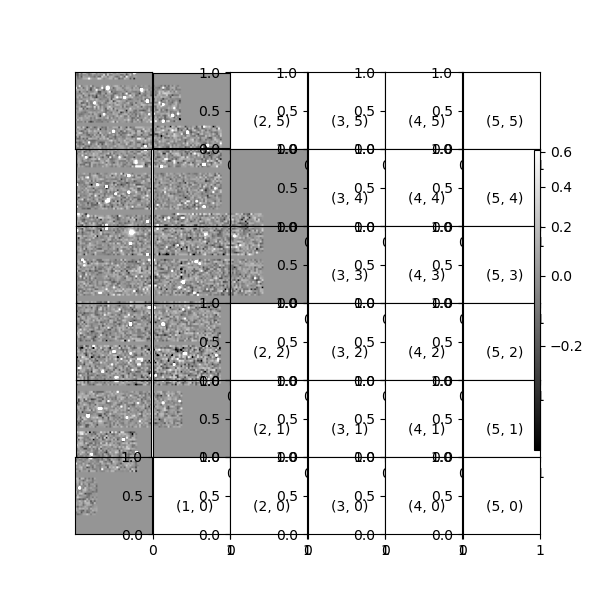

Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrieve data for patch (4, 5)
Failed to retrieve data for patch (4, 4)
Failed to retrieve data for patch (4, 3)
Failed to retrieve data for patch (4, 2)
Failed to retrieve data for patch (4, 1)
Failed to retrieve data for patch (4, 0)
Failed to retrieve data for patch (5, 5)
Failed to retrieve data for patch (5, 4)
Failed to retrieve data for patch (5, 3)
Failed to retrieve data for patch (5, 2)
Failed to retrieve data for patch (5, 1)
Failed to retrieve data for patch (5, 0)
8363


<IPython.core.display.Javascript object>


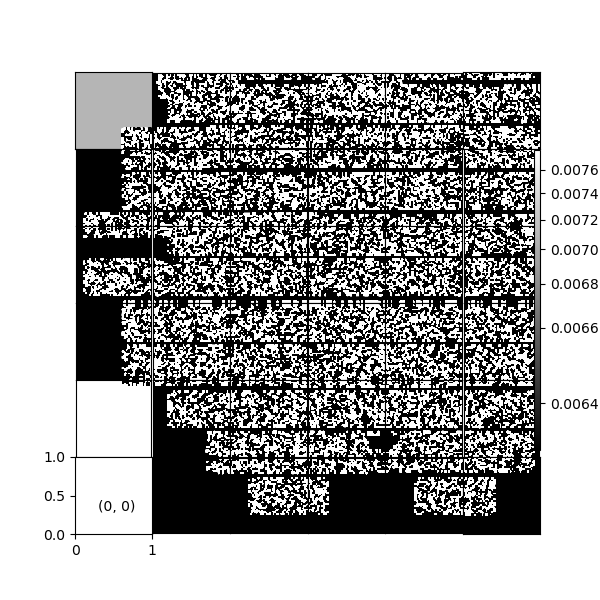

Failed to retrieve data for patch (0, 0)
8364


<IPython.core.display.Javascript object>


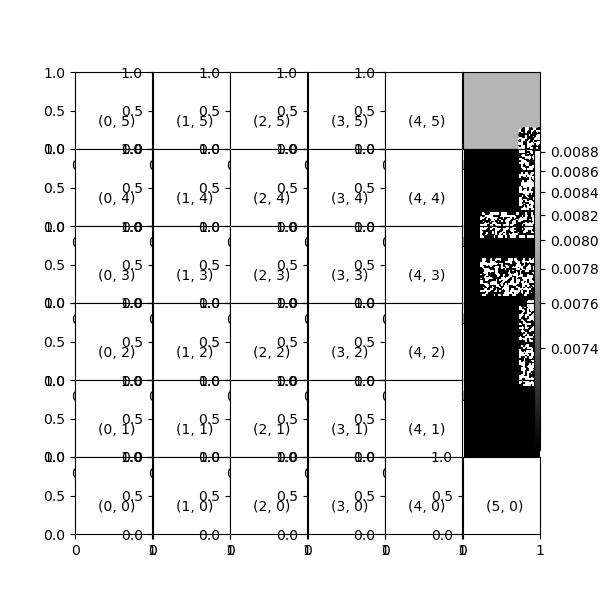

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrie

<IPython.core.display.Javascript object>


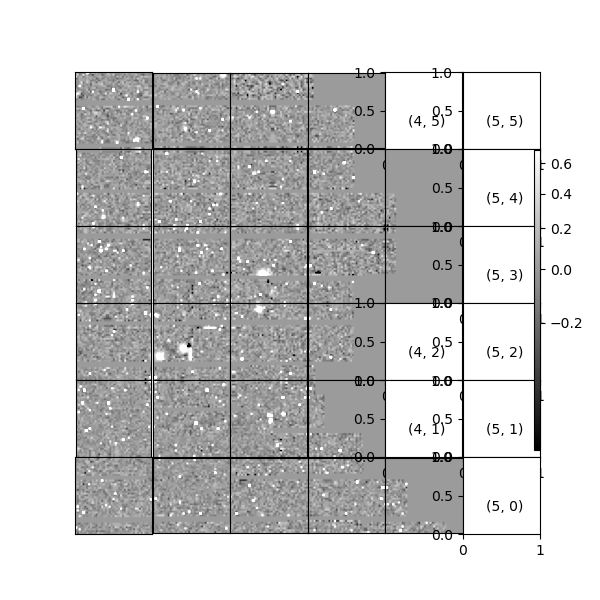

Failed to retrieve data for patch (4, 5)
Failed to retrieve data for patch (4, 2)
Failed to retrieve data for patch (4, 1)
Failed to retrieve data for patch (5, 5)
Failed to retrieve data for patch (5, 4)
Failed to retrieve data for patch (5, 3)
Failed to retrieve data for patch (5, 2)
Failed to retrieve data for patch (5, 1)
Failed to retrieve data for patch (5, 0)
8605


<IPython.core.display.Javascript object>


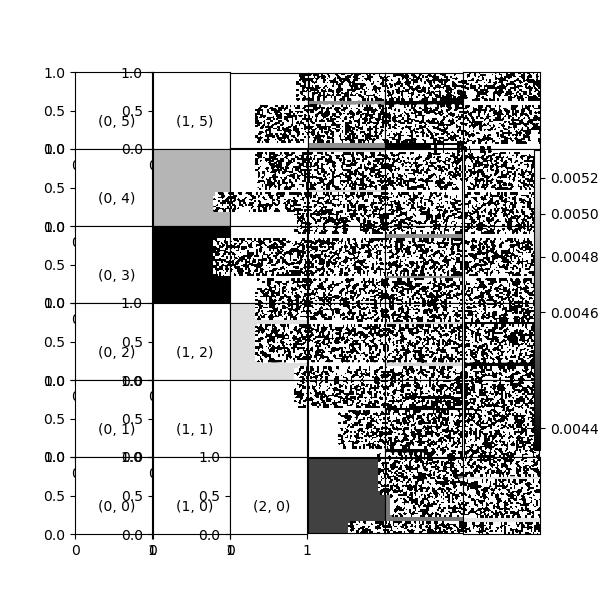

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 0)
8844


<IPython.core.display.Javascript object>


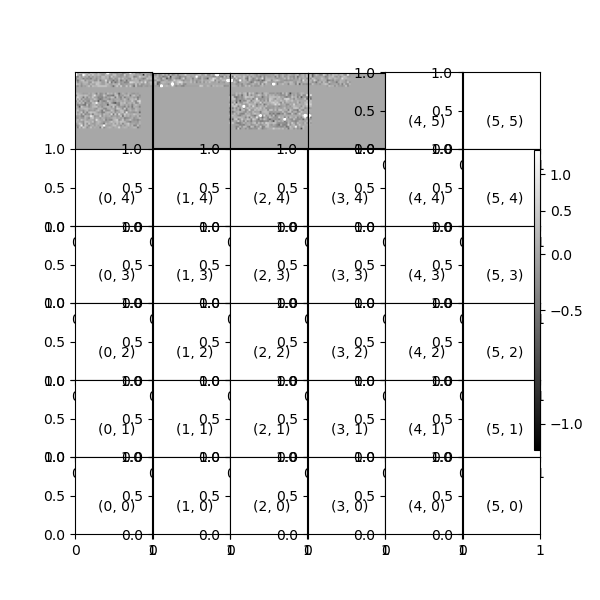

Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrieve data for patch (4, 5)
Failed to retrieve data for patch (4, 4)
Failed to retrieve data for patch (4, 3)
Failed to retrieve data for patch (4, 2)
Failed to retrie

<IPython.core.display.Javascript object>


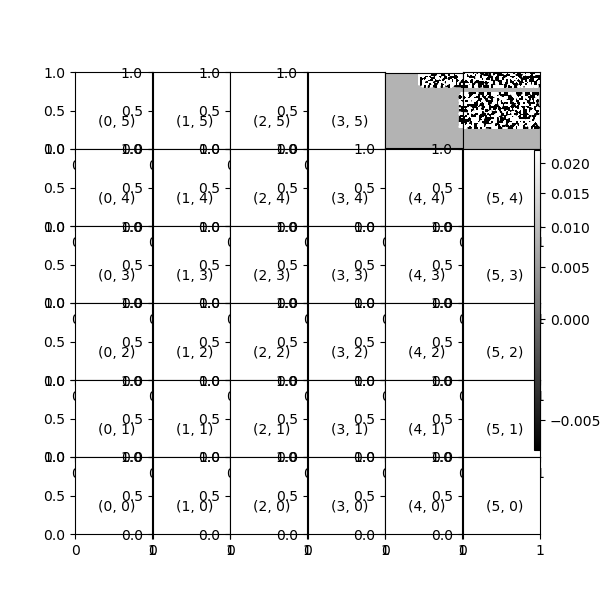

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrie

<IPython.core.display.Javascript object>


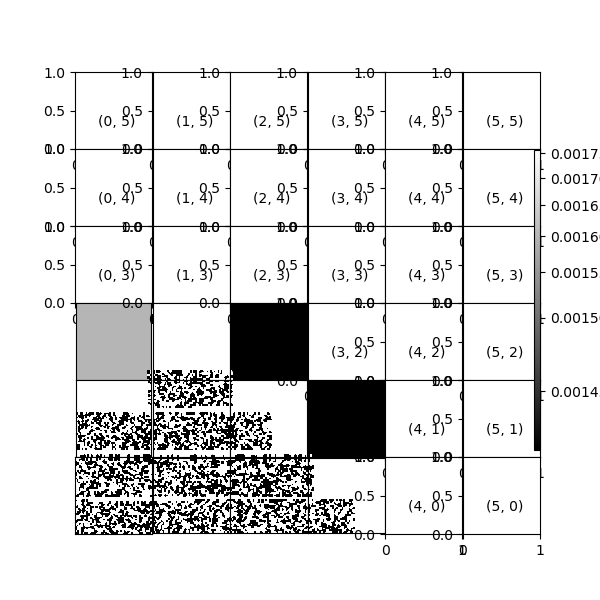

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (4, 5)
Failed to retrieve data for patch (4, 4)
Failed to retrieve data for patch (4, 3)
Failed to retrieve data for patch (4, 2)
Failed to retrieve data for patch (4, 1)
Failed to retrieve data for patch (4, 0)
Failed to retrieve data for patch (5, 5)
Failed to retrieve data for patch (5, 4)
Failed to retrieve data for patch (5, 3)
Failed to retrieve data for patch (5, 2)
Failed to retrieve data for patch (5, 1)
Failed to retrie

<IPython.core.display.Javascript object>


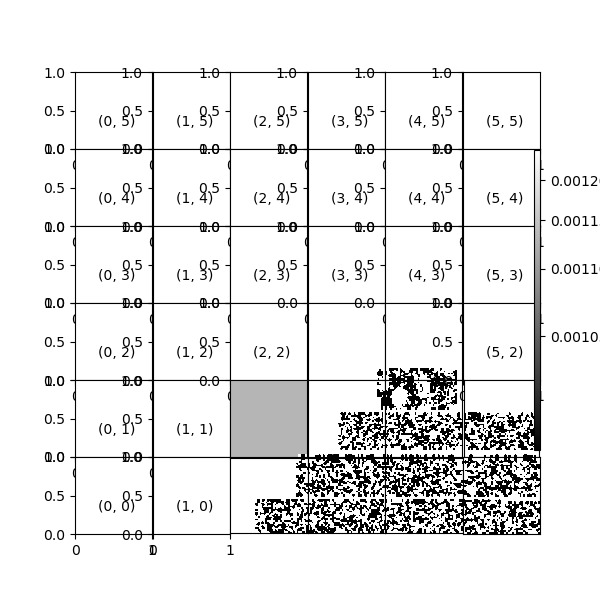

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (4, 5)
Failed to retrieve data for patch (4, 4)
Failed to retrieve data for patch (4, 3)
Failed to retrieve data for patch (5, 5)
Failed to retrieve data for patch (5, 4)
Failed to retrie

<IPython.core.display.Javascript object>


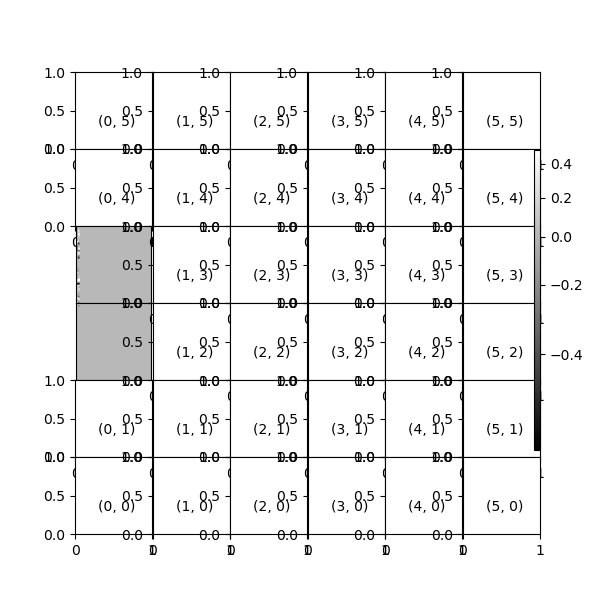

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrieve data for patch (4, 5)
Failed to retrieve data for patch (4, 4)
Failed to retrie

<IPython.core.display.Javascript object>


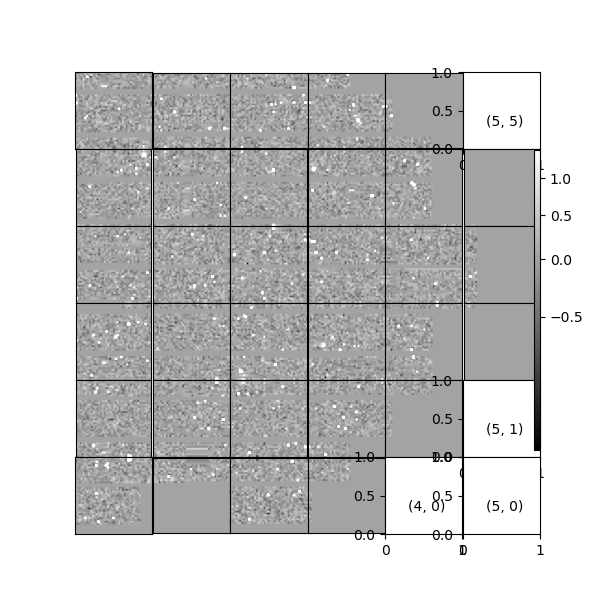

Failed to retrieve data for patch (4, 0)
Failed to retrieve data for patch (5, 5)
Failed to retrieve data for patch (5, 1)
Failed to retrieve data for patch (5, 0)
9087


<IPython.core.display.Javascript object>


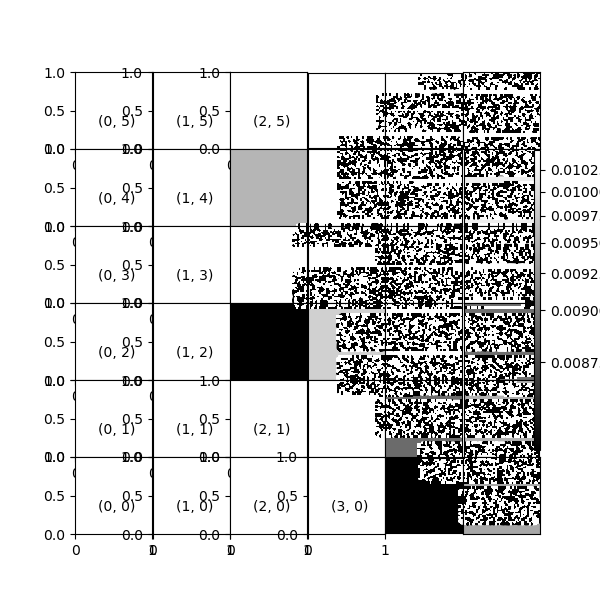

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 0)
9328


<IPython.core.display.Javascript object>


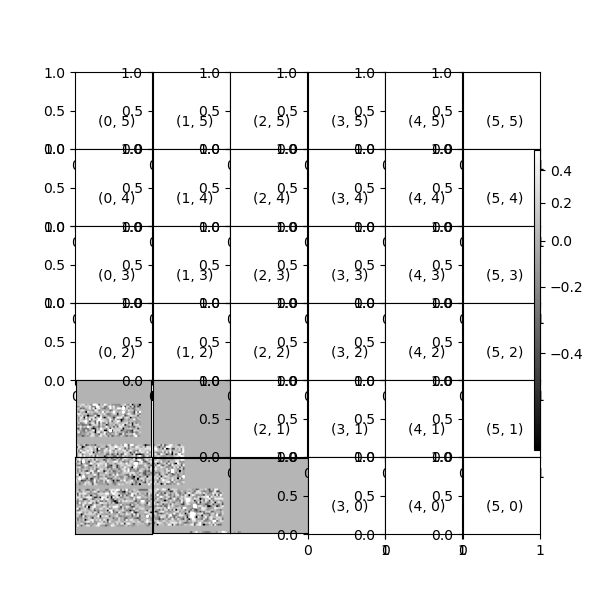

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrieve data for patch (4, 5)
Failed to retrieve data for patch (4, 4)
Failed to retrieve data for patch (4, 3)
Failed to retrieve data for patch (4, 2)
Failed to retrieve data for patch (4, 1)
Failed to retrie

<IPython.core.display.Javascript object>


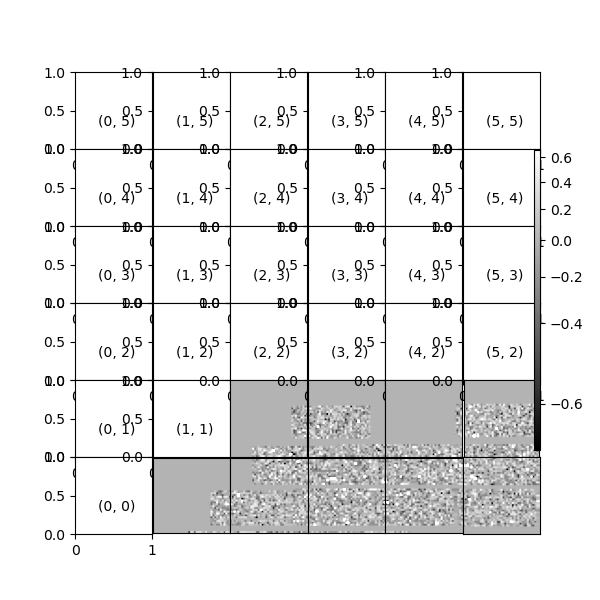

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (4, 5)
Failed to retrieve data for patch (4, 4)
Failed to retrieve data for patch (4, 3)
Failed to retrieve data for patch (4, 2)
Failed to retrieve data for patch (5, 5)
Failed to retrie

<IPython.core.display.Javascript object>


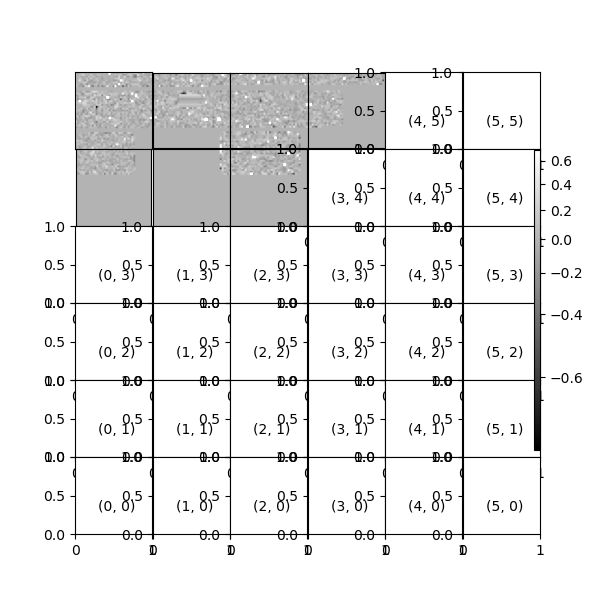

Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrieve data for patch (4, 5)
Failed to retrieve data for patch (4, 4)
Failed to retrieve data for patch (4, 3)
Failed to retrieve data for patch (4, 2)
Failed to retrieve data for patch (4, 1)
Failed to retrieve data for patch (4, 0)
Failed to retrieve data for patch (5, 5)
Failed to retrie

/project/mrawls/ap_pipe-notebooks/coaddAnalysis.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(nx, ny), constrained_layout=False)


<IPython.core.display.Javascript object>


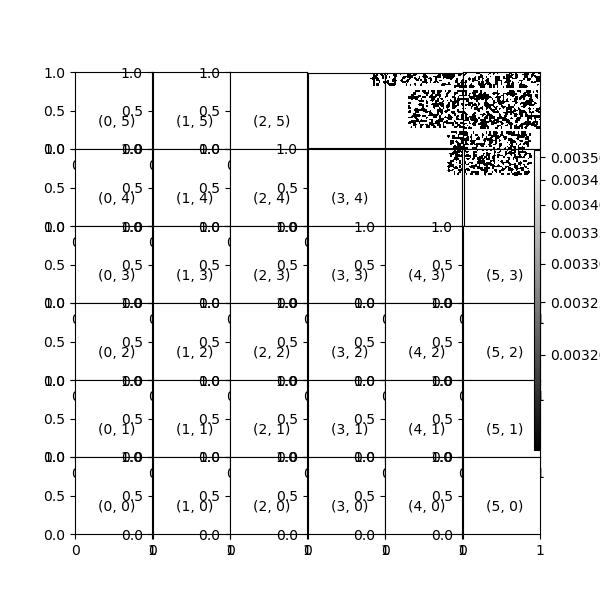

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrieve data for patch (4, 3)
Failed to retrie

<IPython.core.display.Javascript object>


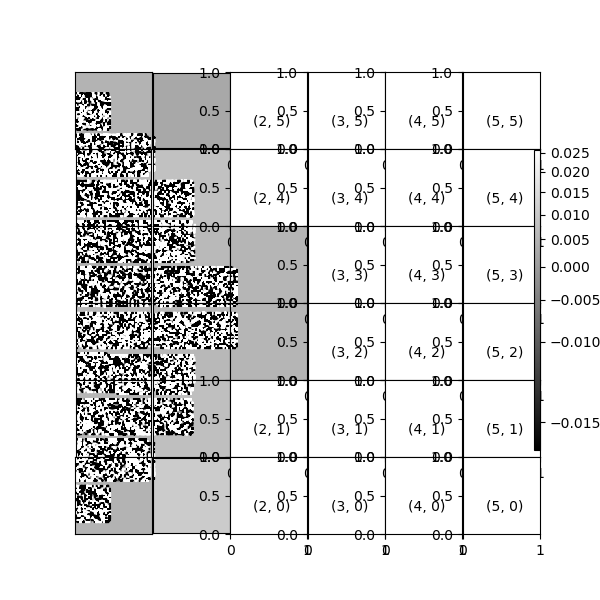

Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrieve data for patch (4, 5)
Failed to retrieve data for patch (4, 4)
Failed to retrieve data for patch (4, 3)
Failed to retrieve data for patch (4, 2)
Failed to retrieve data for patch (4, 1)
Failed to retrieve data for patch (4, 0)
Failed to retrieve data for patch (5, 5)
Failed to retrieve data for patch (5, 4)
Failed to retrieve data for patch (5, 3)
Failed to retrieve data for patch (5, 2)
Failed to retrieve data for patch (5, 1)
Failed to retrieve data for patch (5, 0)
9813


<IPython.core.display.Javascript object>


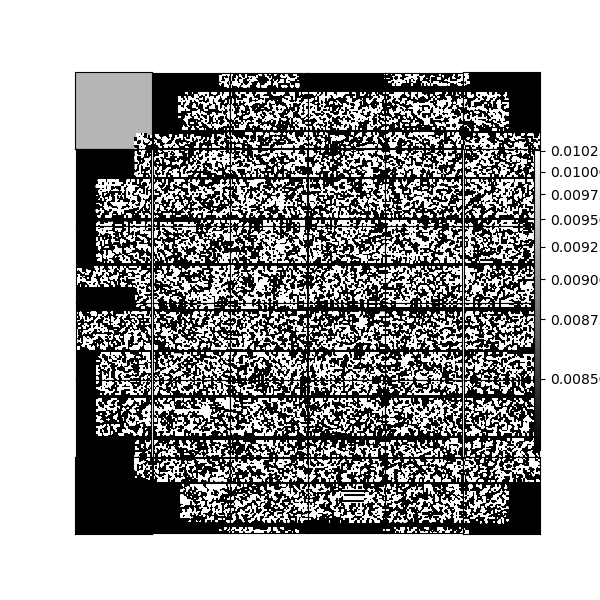

9814


<IPython.core.display.Javascript object>


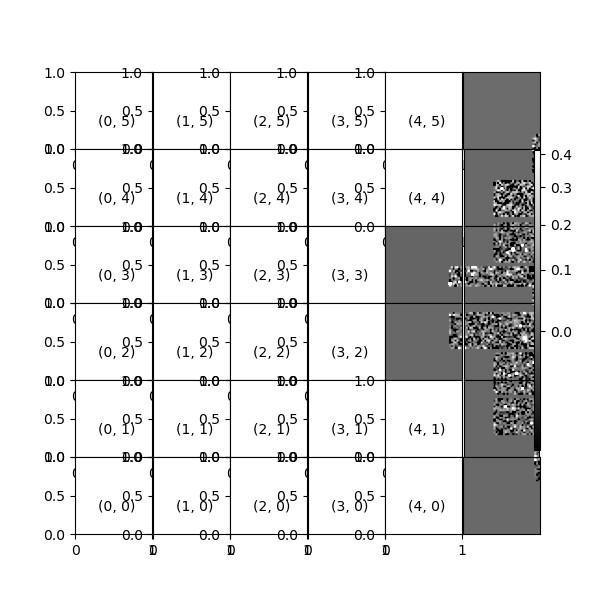

Failed to retrieve data for patch (0, 5)
Failed to retrieve data for patch (0, 4)
Failed to retrieve data for patch (0, 3)
Failed to retrieve data for patch (0, 2)
Failed to retrieve data for patch (0, 1)
Failed to retrieve data for patch (0, 0)
Failed to retrieve data for patch (1, 5)
Failed to retrieve data for patch (1, 4)
Failed to retrieve data for patch (1, 3)
Failed to retrieve data for patch (1, 2)
Failed to retrieve data for patch (1, 1)
Failed to retrieve data for patch (1, 0)
Failed to retrieve data for patch (2, 5)
Failed to retrieve data for patch (2, 4)
Failed to retrieve data for patch (2, 3)
Failed to retrieve data for patch (2, 2)
Failed to retrieve data for patch (2, 1)
Failed to retrieve data for patch (2, 0)
Failed to retrieve data for patch (3, 5)
Failed to retrieve data for patch (3, 4)
Failed to retrieve data for patch (3, 3)
Failed to retrieve data for patch (3, 2)
Failed to retrieve data for patch (3, 1)
Failed to retrieve data for patch (3, 0)
Failed to retrie

In [5]:
# the above was for "take1" templates, the below is for "take2" templates

tractList = [10054, 10055, 10056, 8122, 8123, 8362, 8363, 8364, 8604, 8605, 8844,
             8845, 8846, 8847, 9085, 9086, 9087, 9328, 9329, 9570, 9571, 9812, 9813, 9814]
patchList = np.arange(0, 36)
for tract in tractList:
    print(tract)
    try:
        coa.mosaicCoadd(repo, patchList, band='g', tractIndex=tract, collections='u/mrawls/DM-34710/templates',
                        skymapName=skymap, instrument=instrument, coaddName='goodSeeingCoadd')
    except UnboundLocalError:  # there is a bug in mosaicCoadd if no data is found
        continue